# Unsupervised Learning: Trade & Ahead

## Problem Statement

### Context

The stock market has consistently proven to be a good place to invest in and save for the future. There are a lot of compelling reasons to invest in stocks. It can help in fighting inflation, create wealth, and also provides some tax benefits. Good steady returns on investments over a long period of time can also grow a lot more than seems possible. Also, thanks to the power of compound interest, the earlier one starts investing, the larger the corpus one can have for retirement. Overall, investing in stocks can help meet life's financial aspirations.

It is important to maintain a diversified portfolio when investing in stocks in order to maximise earnings under any market condition. Having a diversified portfolio tends to yield higher returns and face lower risk by tempering potential losses when the market is down. It is often easy to get lost in a sea of financial metrics to analyze while determining the worth of a stock, and doing the same for a multitude of stocks to identify the right picks for an individual can be a tedious task. By doing a cluster analysis, one can identify stocks that exhibit similar characteristics and ones which exhibit minimum correlation. This will help investors better analyze stocks across different market segments and help protect against risks that could make the portfolio vulnerable to losses.


### Objective

Trade&Ahead is a financial consultancy firm who provide their customers with personalized investment strategies. They have hired you as a Data Scientist and provided you with data comprising stock price and some financial indicators for a few companies listed under the New York Stock Exchange. They have assigned you the tasks of analyzing the data, grouping the stocks based on the attributes provided, and sharing insights about the characteristics of each group.

### Data Dictionary

- Ticker Symbol: An abbreviation used to uniquely identify publicly traded shares of a particular stock on a particular stock market
- Company: Name of the company
- GICS Sector: The specific economic sector assigned to a company by the Global Industry Classification Standard (GICS) that best defines its business operations
- GICS Sub Industry: The specific sub-industry group assigned to a company by the Global Industry Classification Standard (GICS) that best defines its business operations
- Current Price: Current stock price in dollars
- Price Change: Percentage change in the stock price in 13 weeks
- Volatility: Standard deviation of the stock price over the past 13 weeks
- ROE: A measure of financial performance calculated by dividing net income by shareholders' equity (shareholders' equity is equal to a company's assets minus its debt)
- Cash Ratio: The ratio of a  company's total reserves of cash and cash equivalents to its total current liabilities
- Net Cash Flow: The difference between a company's cash inflows and outflows (in dollars)
- Net Income: Revenues minus expenses, interest, and taxes (in dollars)
- Earnings Per Share: Company's net profit divided by the number of common shares it has outstanding (in dollars)
- Estimated Shares Outstanding: Company's stock currently held by all its shareholders
- P/E Ratio: Ratio of the company's current stock price to the earnings per share
- P/B Ratio: Ratio of the company's stock price per share by its book value per share (book value of a company is the net difference between that company's total assets and total liabilities)

## Importing necessary libraries and data

In [1]:
# this will help in making the Python code more structured automatically (good coding practice)
#%load_ext nb_black

# Libraries to help with reading and manipulating data
import pandas as pd
import numpy as np

# Libaries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)
# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200)

# to scale the data using z-score
from sklearn.preprocessing import StandardScaler

# to compute distances
from scipy.spatial.distance import pdist

# to perform k-means clustering and compute silhouette scores
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Dimentionality reduction
from sklearn.decomposition import PCA

# For visualizing high-dimensional data
from sklearn.manifold import TSNE

# to visualize the elbow curve and silhouette scores
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

# to perform hierarchical clustering, compute cophenetic correlation, and create dendrograms
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet

# to visualize the elbow curve and silhouette scores
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

#format numeric data for easier readability
pd.set_option(
    "display.float_format", lambda x: "%.2f" % x
)  # to display numbers rounded off to 2 decimal places

# to perform PCA
from sklearn.decomposition import PCA

# To supress warnings
import warnings
warnings.filterwarnings("ignore")

In [2]:
# !pip install scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==1.5.3 yellowbrick==1.5 -q --user

**Note**: *After running the above cell, kindly restart the notebook kernel and run all cells sequentially from the start again.*

In [3]:
# Loading the data set
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
#  read the data
df = pd.read_csv('/content/drive/MyDrive/Python/stock_data_TradeAhead.csv')

## Data Overview

- Observations
- Sanity checks

In [5]:
# print first five rows
df.head()

,Ticker Symbol,Security,GICS Sector,GICS Sub Industry,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio
0,AAL,American Airlines Group,Industrials,Airlines,42.35,10.00,1.69,135,51,-604000000,7610000000,11.39,668129938.50,3.72,-8.78
1,ABBV,AbbVie,Health Care,Pharmaceuticals,59.24,8.34,2.20,130,77,51000000,5144000000,3.15,1633015873.00,18.81,-8.75
2,ABT,Abbott Laboratories,Health Care,Health Care Equipment,44.91,11.30,1.27,21,67,938000000,4423000000,2.94,1504421769.00,15.28,-0.39
3,ADBE,Adobe Systems Inc,Information Technology,Application Software,93.94,13.98,1.36,9,180,-240840000,629551000,1.26,499643650.80,74.56,4.20
4,ADI,"Analog Devices, Inc.",Information Technology,Semiconductors,55.32,-1.83,1.70,14,272,315120000,696878000,0.31,2247993548.00,178.45,1.06


In [6]:
# print shape of dataset
df.shape

(340, 15)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 340 entries, 0 to 339
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Ticker Symbol                 340 non-null    object 
 1   Security                      340 non-null    object 
 2   GICS Sector                   340 non-null    object 
 3   GICS Sub Industry             340 non-null    object 
 4   Current Price                 340 non-null    float64
 5   Price Change                  340 non-null    float64
 6   Volatility                    340 non-null    float64
 7   ROE                           340 non-null    int64  
 8   Cash Ratio                    340 non-null    int64  
 9   Net Cash Flow                 340 non-null    int64  
 10  Net Income                    340 non-null    int64  
 11  Earnings Per Share            340 non-null    float64
 12  Estimated Shares Outstanding  340 non-null    float64
 13  P/E R

In [8]:
# checking for duplicate values
df.duplicated().sum()

0

In [9]:
# checking for missing values
df.isna().sum()

,0
Ticker Symbol,0
Security,0
GICS Sector,0
GICS Sub Industry,0
Current Price,0
Price Change,0
Volatility,0
ROE,0
Cash Ratio,0
Net Cash Flow,0


In [10]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Ticker Symbol,340,340,AAL,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Security,340,340,American Airlines Group,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GICS Sector,340,11,Industrials,53,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GICS Sub Industry,340,104,Oil & Gas Exploration & Production,16,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Current Price,340.00,NaN,NaN,NaN,80.86,98.06,4.50,38.55,59.70,92.88,1274.95
Price Change,340.00,NaN,NaN,NaN,4.08,12.01,-47.13,-0.94,4.82,10.70,55.05
Volatility,340.00,NaN,NaN,NaN,1.53,0.59,0.73,1.13,1.39,1.70,4.58
ROE,340.00,NaN,NaN,NaN,39.60,96.55,1.00,9.75,15.00,27.00,917.00
Cash Ratio,340.00,NaN,NaN,NaN,70.02,90.42,0.00,18.00,47.00,99.00,958.00
Net Cash Flow,340.00,NaN,NaN,NaN,55537620.59,1946365312.18,-11208000000.00,-193906500.00,2098000.00,169810750.00,20764000000.00


Observations:

General Structure

- The dataset contains a total of 340 entries with 15 columns. The data types include both object (string) and numerical (float64, int64) values.
- No mossing or duplicate data.

Categorical Variables

- The "Ticker Symbol" and "Security" columns each have 340 unique entries, indicating that every row represents a distinct company or stock.
- The "GICS Sector" column has 11 unique sectors, with "Industrials" being the most frequent, appearing 53 times.
- The "GICS Sub Industry" column includes 104 unique sub-industries, with "Oil & Gas Exploration & Production" being the most common, occurring 16 times.

Numerical Variables

- The "Current Price" column has a mean value of 80.86 with a standard deviation of 98.06. The prices range from 4.50 to 1274.95, indicating a wide diversity in stock prices.
- The "Price Change" column shows an average change of 4.08%, with a standard deviation of 12.01%. The price changes range from -47.13% to 55.05%, indicating that while most stocks have modest changes, some experience significant volatility.
- The "Volatility" column has a mean of 1.53 and a standard deviation of 0.59, with values ranging from 0.73 to 4.58. This suggests that most stocks have moderate volatility, with a few being highly volatile.
- The "ROE (Return on Equity)" column has a mean of 39.60% and a standard deviation of 96.55%, ranging from 1% to 917%. This indicates a significant variation in companies' returns on equity, with some showing exceptionally high returns.
- The "Cash Ratio" column shows an average value of 70.02, with a standard deviation of 90.42. The cash ratios range from 0 to 958, indicating that some companies have substantial cash reserves relative to their liabilities.
- The "Net Cash Flow" column has a mean of 55,537,620.59 and a standard deviation of 1,946,365,312.18. The net cash flows range from -11,208,000,000.00 to 20,764,000,000.00, showing a large variance, with some companies deeply negative and others highly positive.
- The "Net Income" column indicates an average net income of 1,494,384,602.94 with a standard deviation of 3,940,150,279.33. The net income values range from -23,528,000,000.00 to 24,442,000,000.00, suggesting that while most companies are profitable, a few are either losing significant amounts or earning extremely high profits.
- The "Earnings Per Share (EPS)" column has a mean of 2.78 and a standard deviation of 6.59, with EPS values ranging from -61.20 to 50.09. This variation suggests differences in company sizes, profitability, or share counts.
- The "P/E Ratio" column shows an average of 32.61 with a standard deviation of 44.35. The P/E ratios range from 2.94 to 528.04, indicating that some stocks are trading at high multiples, while others are more conservatively valued.
- The "P/B Ratio" column has an average value of -1.72, which is unusual and may suggest companies trading below their book value, potentially indicating financial distress. The P/B ratios range from -76.12 to 129.06.

Potential Insights

- The Industrials sector is heavily represented, which might skew overall averages. Analyzing each sector separately could provide more accurate insights.
- There appears to be a correlation between volatility and price change, suggesting that more volatile stocks tend to experience higher price changes.
- High ROE companies do not always correspond to high P/E ratios, which could indicate undervalued stocks or those with higher associated risks.



## Exploratory Data Analysis (EDA)

- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

In [11]:
# creating a copy of the data so that original data remains unchanged
df1 = df.copy()

In [12]:
# Convert all object type columns to category
df1 = df.apply(lambda col: col.astype('category') if col.dtype == 'object' else col)

In [13]:
# dropping the ticker symbol column, as it does not provide any information
df1.drop("Ticker Symbol", axis=1, inplace=True)

In [14]:
# view the shape of the dataset
df1_shape=df1.shape
print("Number of rows:", df1_shape[0])
print("Number of columns:", df1_shape[1])

Number of rows: 340
Number of columns: 14


In [15]:
# Check new df
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 340 entries, 0 to 339
Data columns (total 14 columns):
 #   Column                        Non-Null Count  Dtype   
---  ------                        --------------  -----   
 0   Security                      340 non-null    category
 1   GICS Sector                   340 non-null    category
 2   GICS Sub Industry             340 non-null    category
 3   Current Price                 340 non-null    float64 
 4   Price Change                  340 non-null    float64 
 5   Volatility                    340 non-null    float64 
 6   ROE                           340 non-null    int64   
 7   Cash Ratio                    340 non-null    int64   
 8   Net Cash Flow                 340 non-null    int64   
 9   Net Income                    340 non-null    int64   
 10  Earnings Per Share            340 non-null    float64 
 11  Estimated Shares Outstanding  340 non-null    float64 
 12  P/E Ratio                     340 non-null    floa

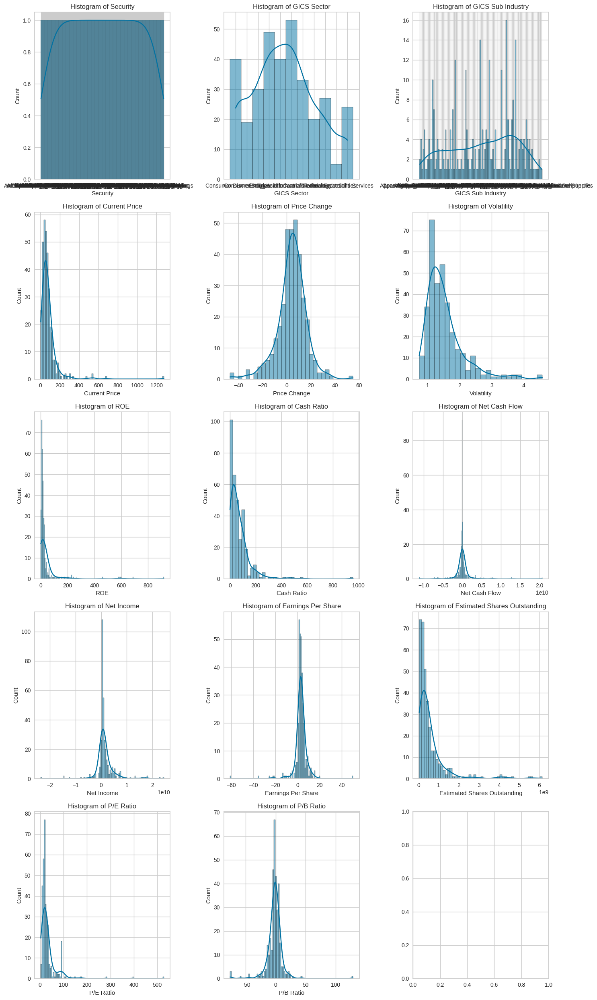

In [16]:
# Univariate exploration
num_plots = len(df1.columns)
num_cols = 3
num_rows = -(-num_plots // num_cols)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows*5))

for i, column in enumerate(df1.columns):
    ax = axes[i // num_cols, i % num_cols]
    if df1[column].dtype == 'object':
        sns.countplot(data=df1, x=column, ax=ax)
        ax.set_title(f'Countplot of {column}')
        ax.set_xlabel(None)
    else:
        sns.histplot(data=df1, x=column, kde=True, ax=ax)
        ax.set_title(f'Histogram of {column}')
plt.tight_layout()
plt.show()

In [17]:
# Check if df1 is a valid DataFrame
print("DataFrame df1:")
print(df1.head())

# Get categorical columns
categorical_columns = df1.select_dtypes(include=['object']).columns
print(f"Categorical columns: {categorical_columns}")

# Function to generate descriptive statistics for categorical variables
def describe_categorical(df1, categorical_columns):
    for column in categorical_columns:
        print(f"Descriptive statistics for {column}:")
        print(df1[column].value_counts())
        print("\nProportions:")
        print(df1[column].value_counts(normalize=True))
        print("\n")

# Call the function
describe_categorical(df1, categorical_columns)

DataFrame df1:
                  Security             GICS Sector      GICS Sub Industry  \
0  American Airlines Group             Industrials               Airlines   
1                   AbbVie             Health Care        Pharmaceuticals   
2      Abbott Laboratories             Health Care  Health Care Equipment   
3        Adobe Systems Inc  Information Technology   Application Software   
4     Analog Devices, Inc.  Information Technology         Semiconductors   

   Current Price  Price Change  Volatility  ROE  Cash Ratio  Net Cash Flow  \
0          42.35         10.00        1.69  135          51     -604000000   
1          59.24          8.34        2.20  130          77       51000000   
2          44.91         11.30        1.27   21          67      938000000   
3          93.94         13.98        1.36    9         180     -240840000   
4          55.32         -1.83        1.70   14         272      315120000   

   Net Income  Earnings Per Share  Estimated Shares O

In [18]:
#provide statistical summary of all categorical columns
df1.describe(include='category').T

,count,unique,top,freq
Security,340,340,3M Company,1
GICS Sector,340,11,Industrials,53
GICS Sub Industry,340,104,Oil & Gas Exploration & Production,16


In [19]:
# function to create labeled barplots

def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=12)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="viridis",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

In [20]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(df, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=df, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=df, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=df, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        df[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        df[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

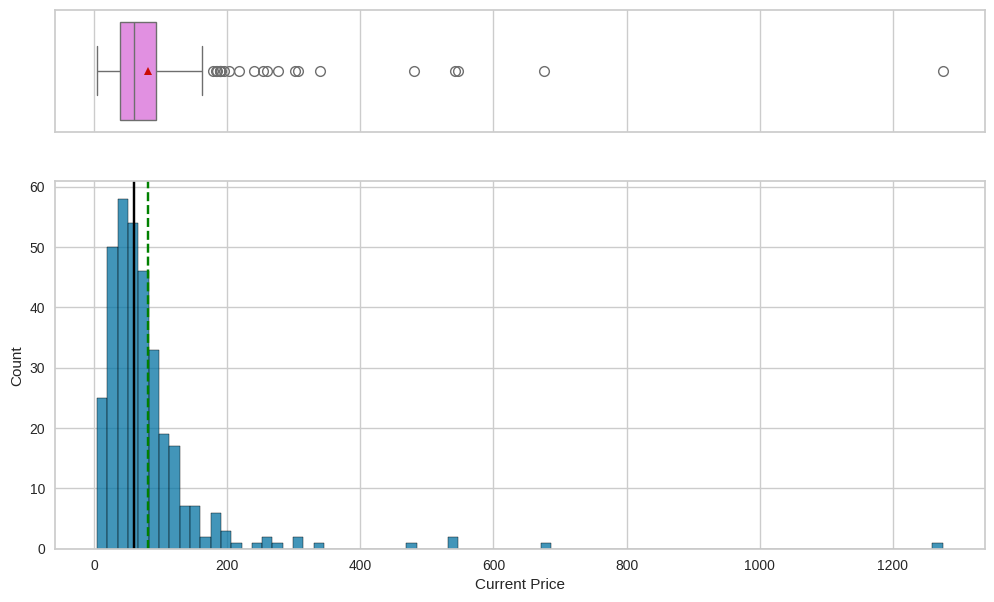

In [21]:
# histogram for current price
histogram_boxplot(df1, 'Current Price')

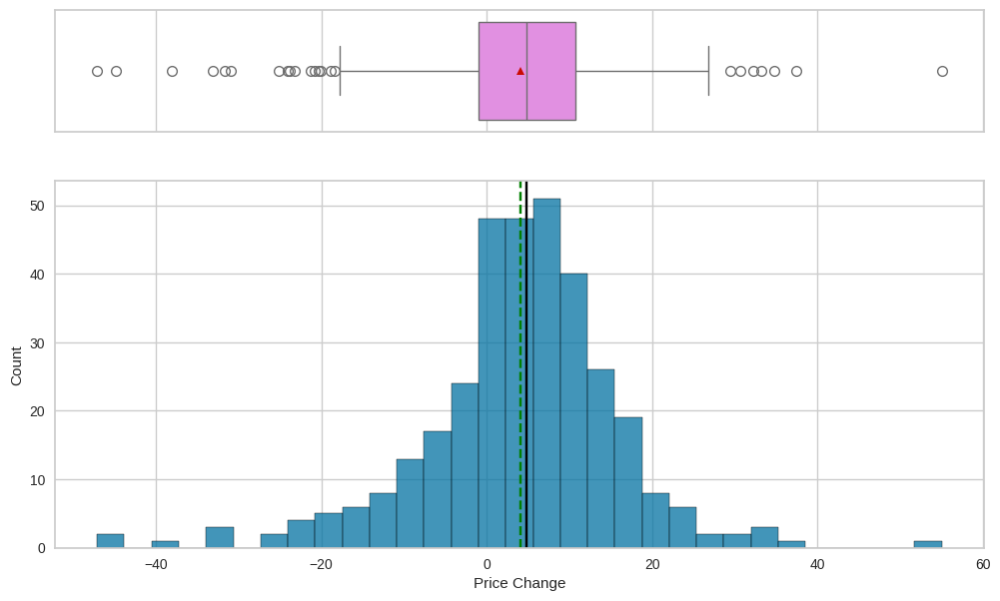

In [22]:
# histogram for price change
histogram_boxplot(df1, 'Price Change')

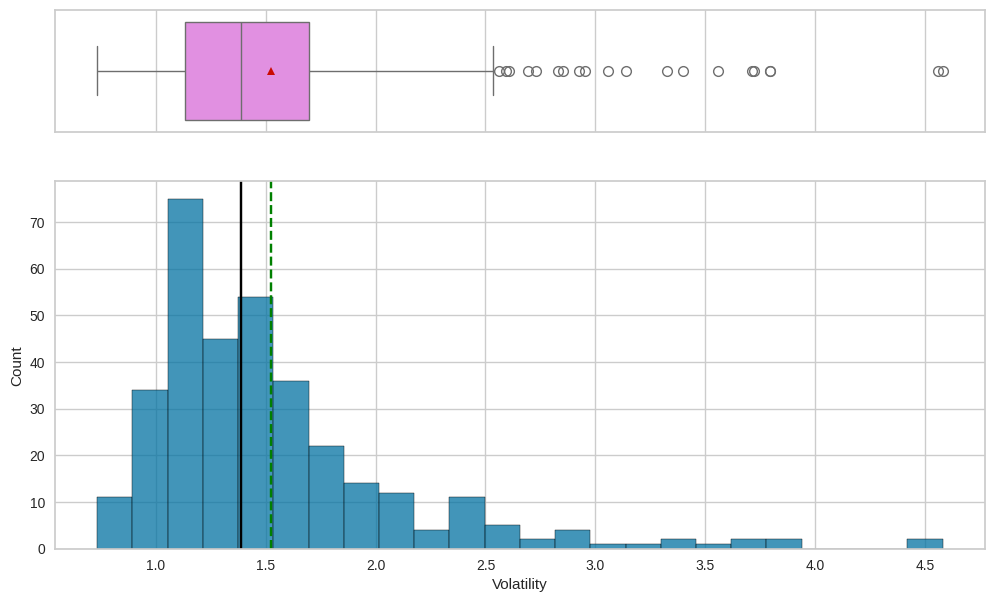

In [23]:
# histogram for volatility

histogram_boxplot(df1, 'Volatility')

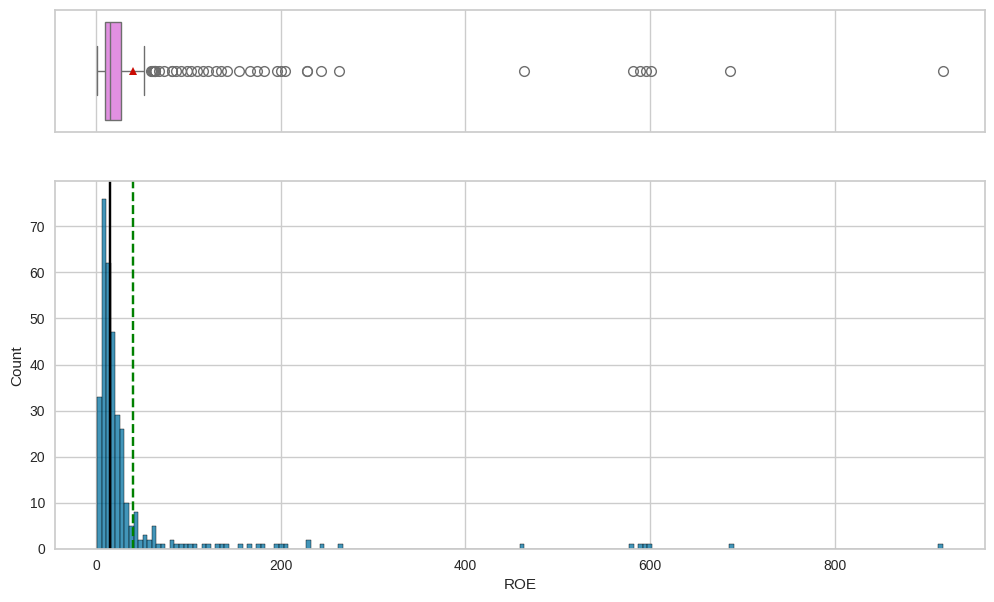

In [24]:
# histogram for ROE
histogram_boxplot(df, 'ROE')

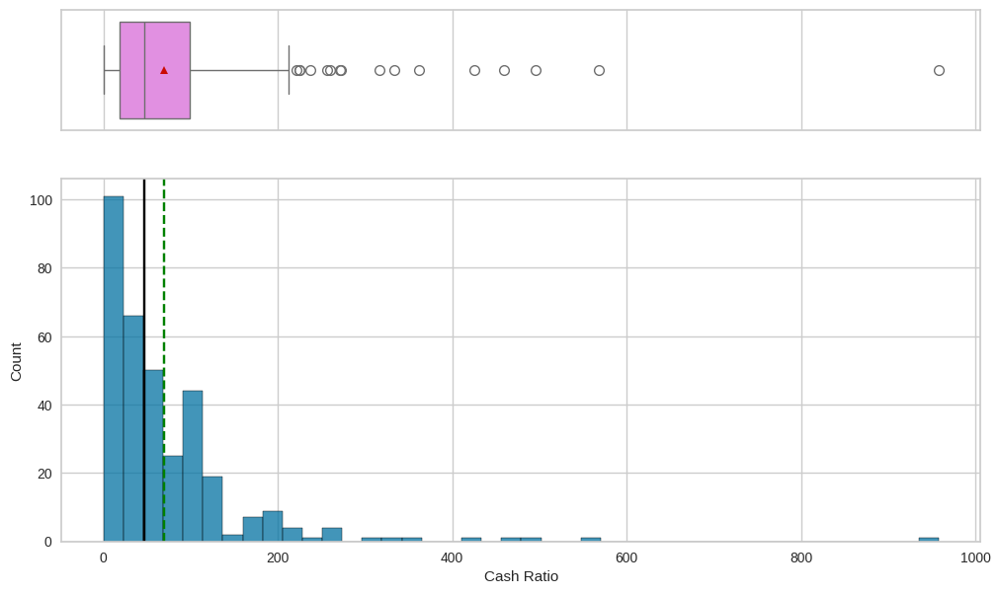

In [25]:
# histogram for cash ratio
histogram_boxplot(df1, 'Cash Ratio')

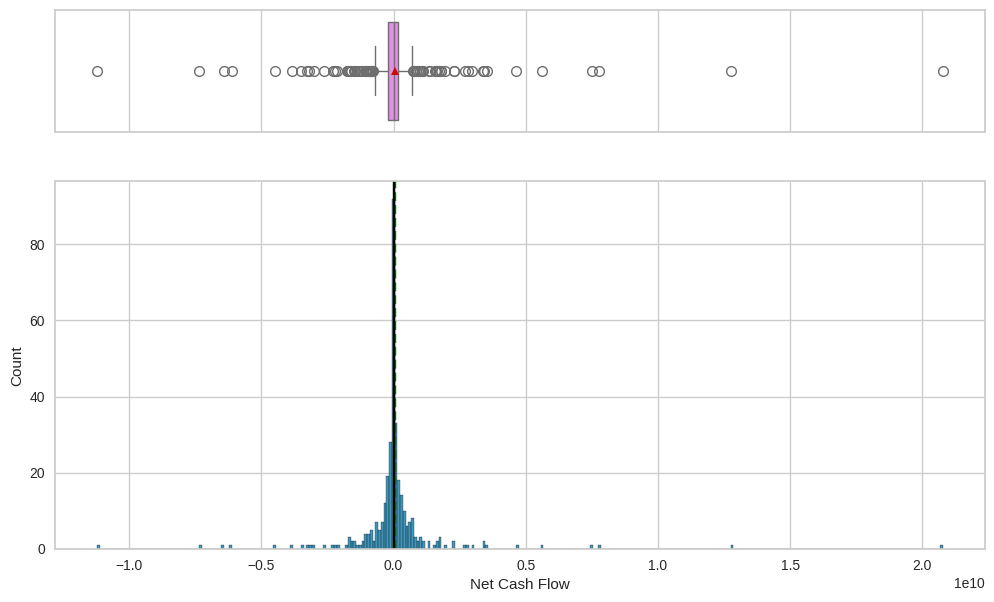

In [26]:
# histogram for net cash flow
histogram_boxplot(df1, 'Net Cash Flow')

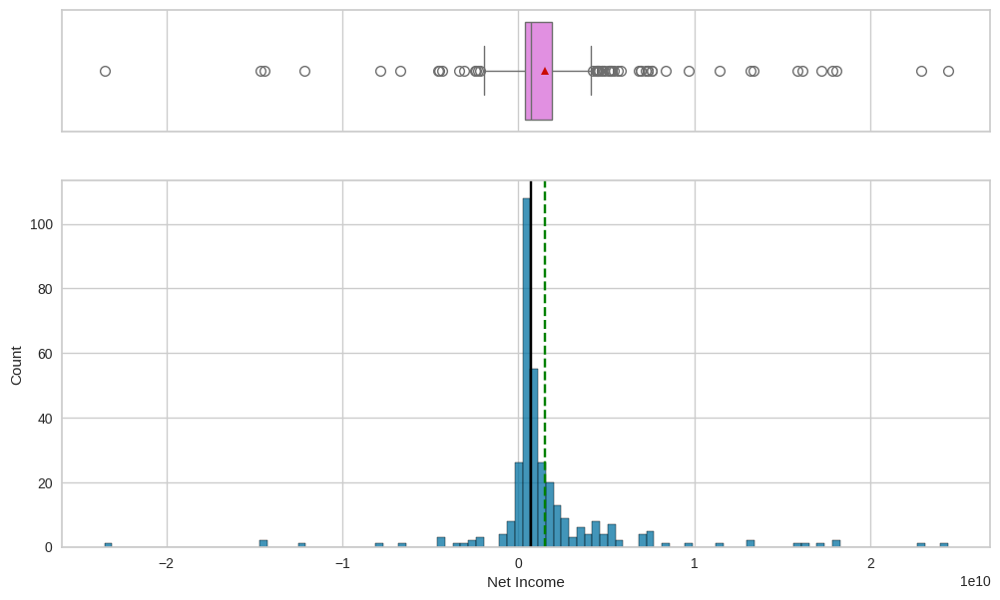

In [27]:
# histogram for net income
histogram_boxplot(df1, 'Net Income')

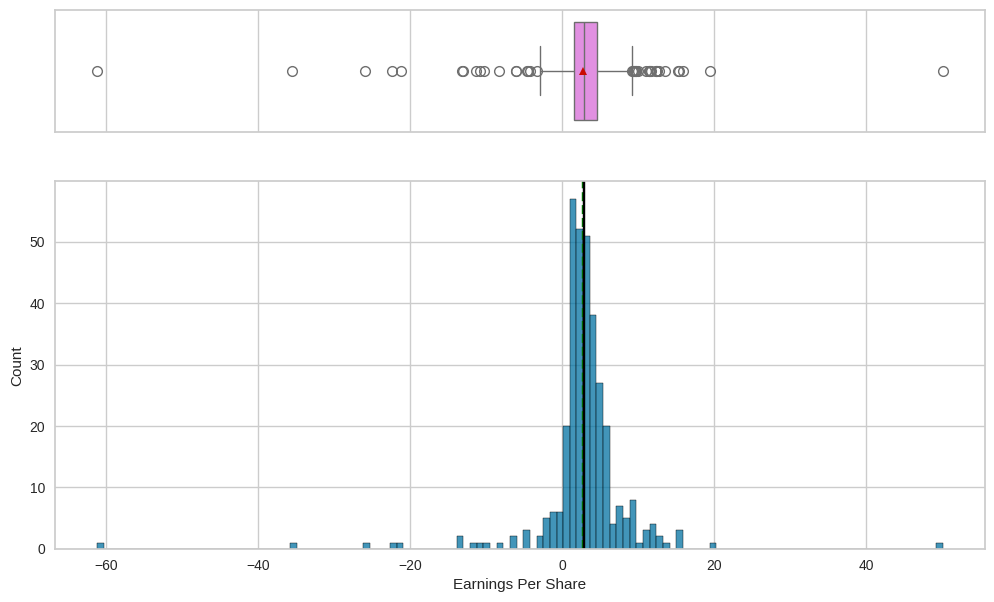

In [28]:
# histogram for earnings per share
histogram_boxplot(df1, 'Earnings Per Share')

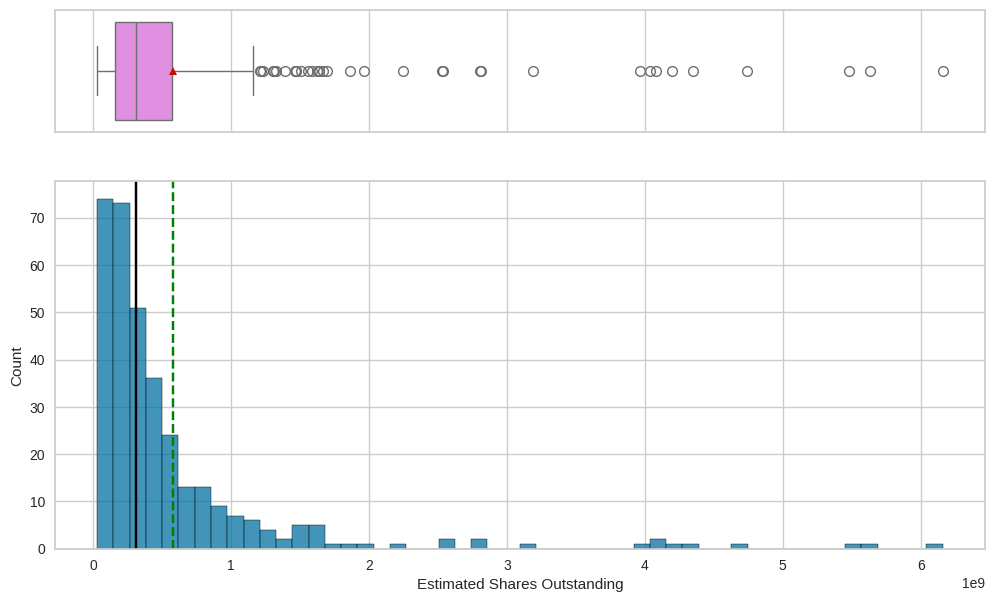

In [29]:
# histogram for Estimated Shares Outstanding
histogram_boxplot(df1, 'Estimated Shares Outstanding')

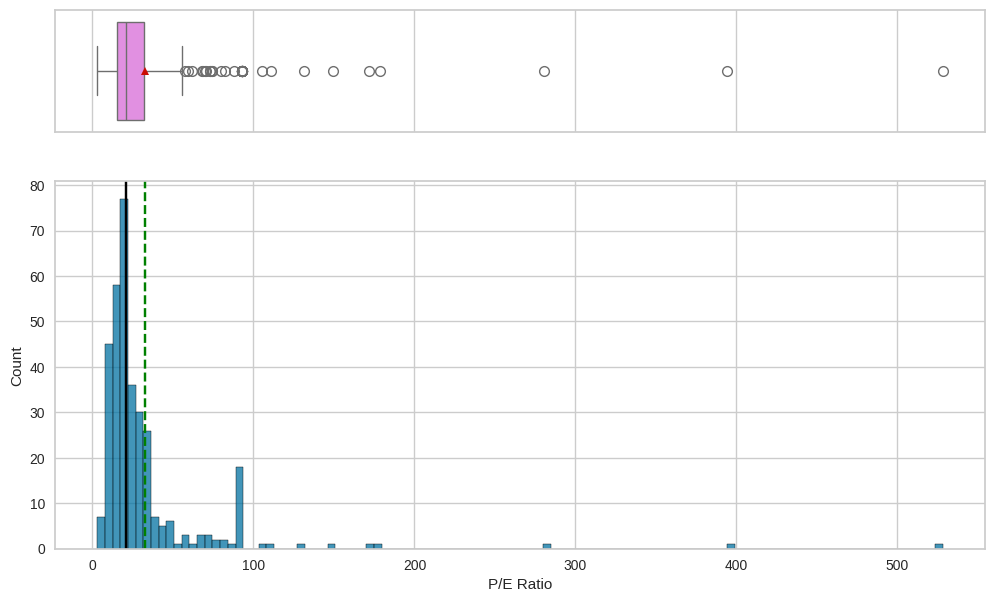

In [30]:
# histogram P/E ratio
histogram_boxplot(df1, 'P/E Ratio')

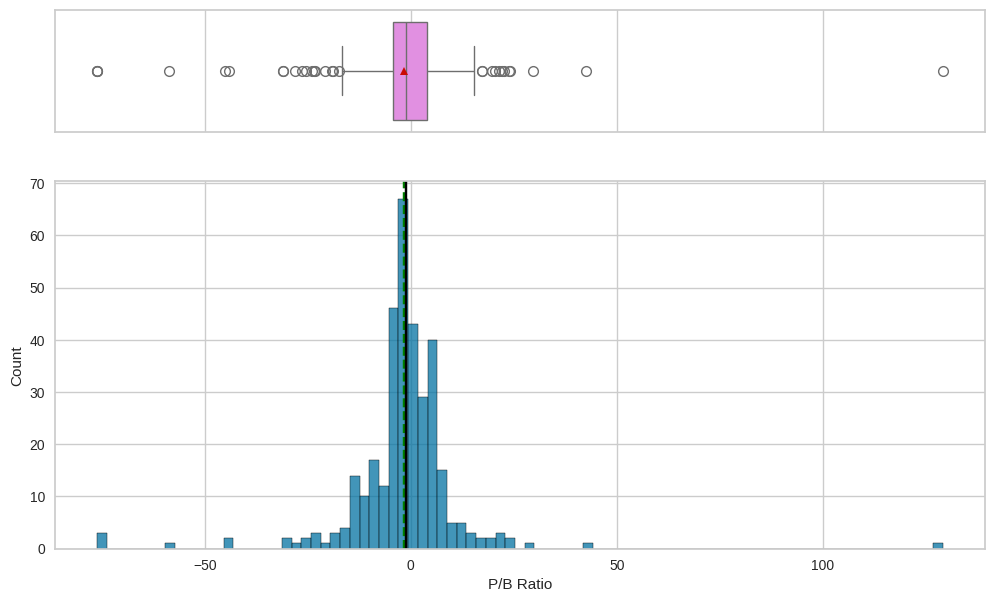

In [31]:
# histogram P/B ratio
histogram_boxplot(df1, 'P/B Ratio')

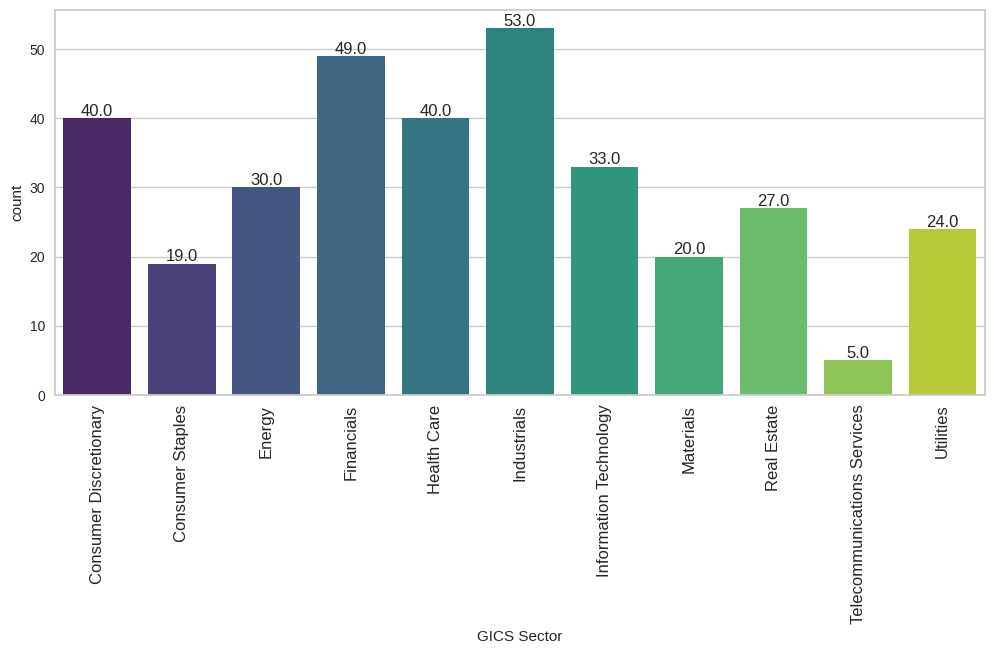

In [32]:
#create labeled barplot of stocks by sector
labeled_barplot(df1, 'GICS Sector')

In [33]:
# five sectors with the most number of stocks
df["GICS Sector"].value_counts().head(n=5)

,count
GICS Sector,
Industrials,53
Financials,49
Health Care,40
Consumer Discretionary,40
Information Technology,33


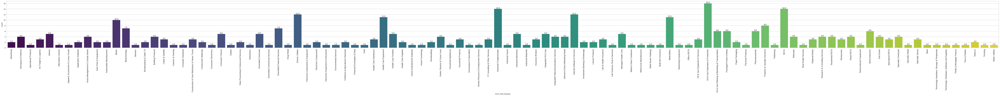

In [34]:
# labeled barplot of stocks by sub industry
labeled_barplot(df, 'GICS Sub Industry')

In [35]:
# five sub industries with the most number of stocks
df['GICS Sub Industry'].value_counts().head(n=5)

,count
GICS Sub Industry,
Oil & Gas Exploration & Production,16
REITs,14
Industrial Conglomerates,14
Electric Utilities,12
Internet Software & Services,12


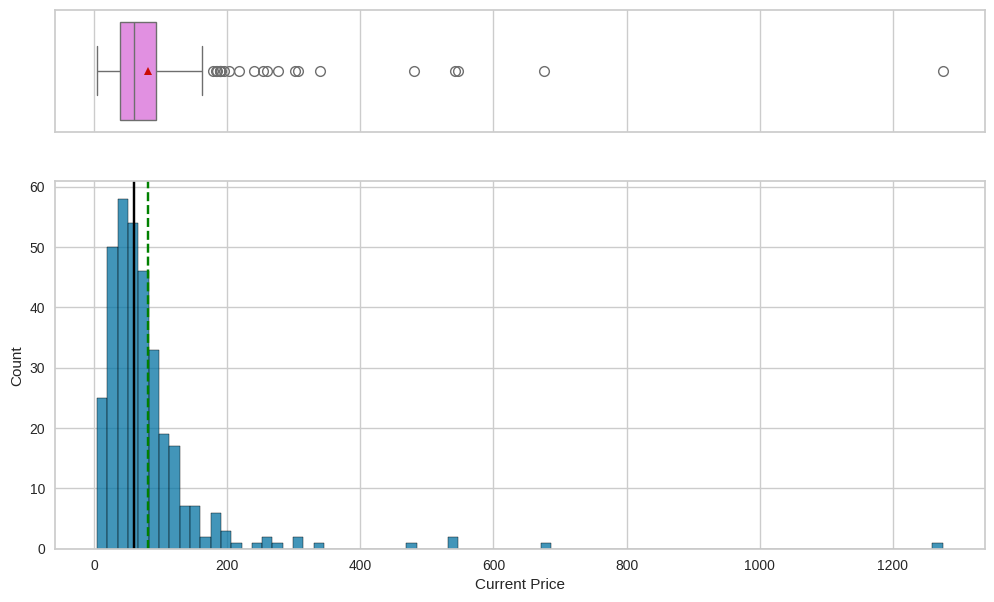

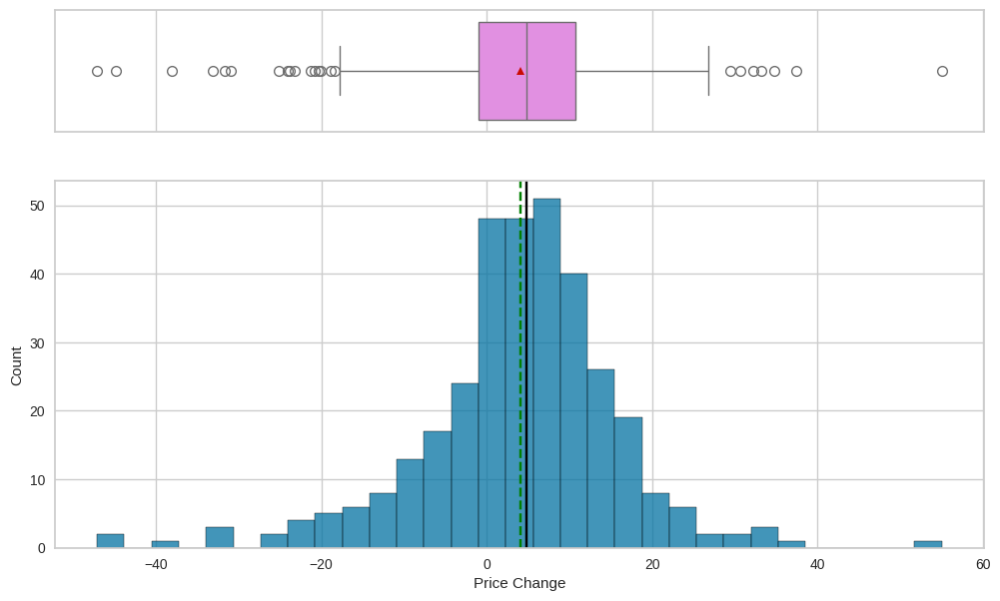

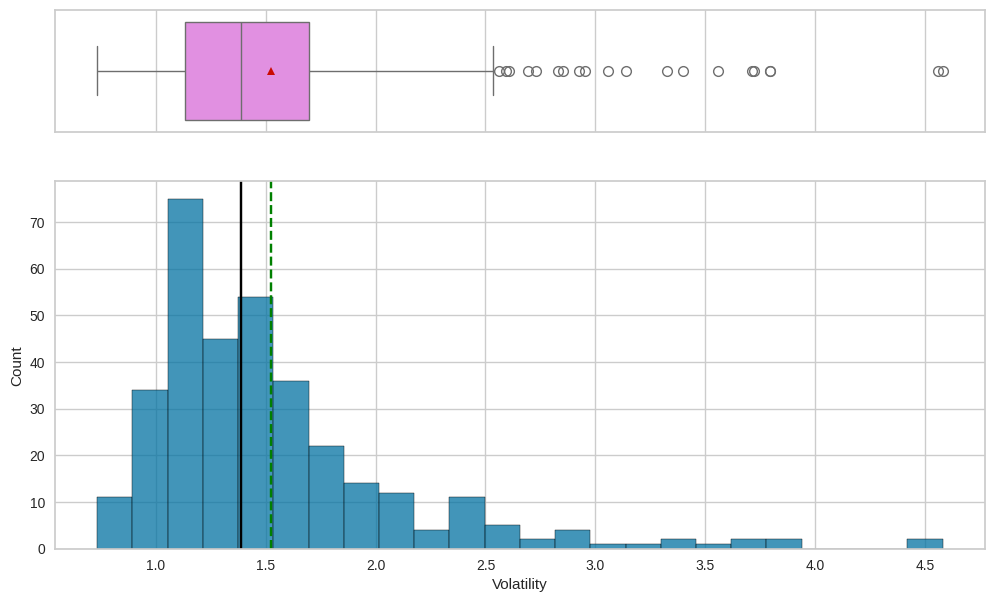

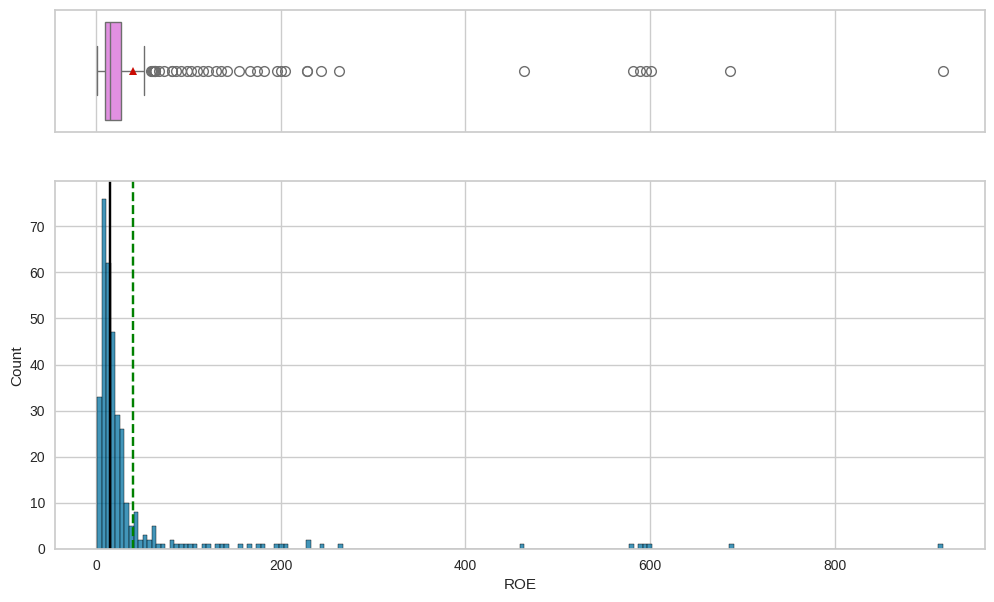

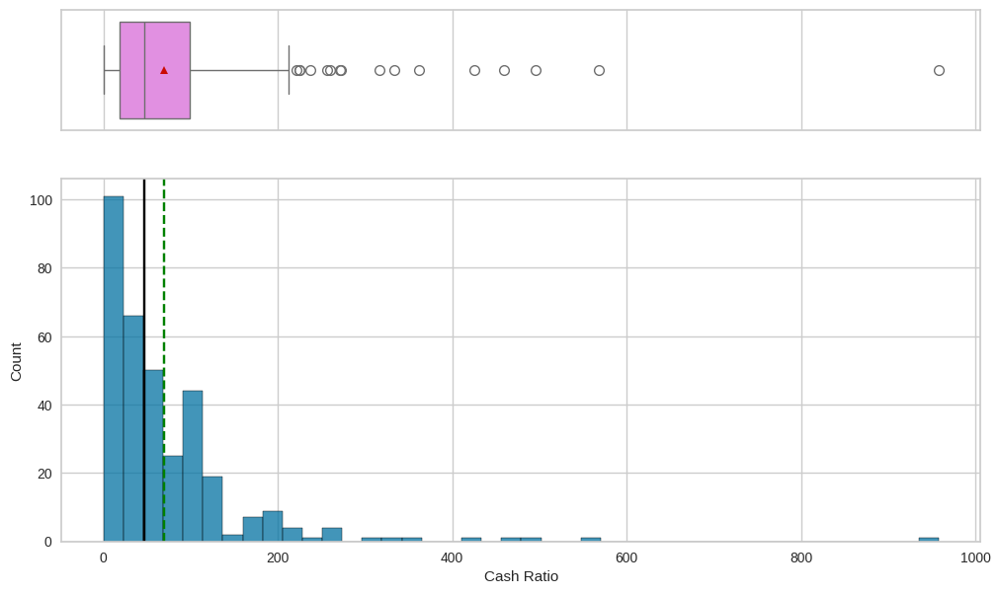

...

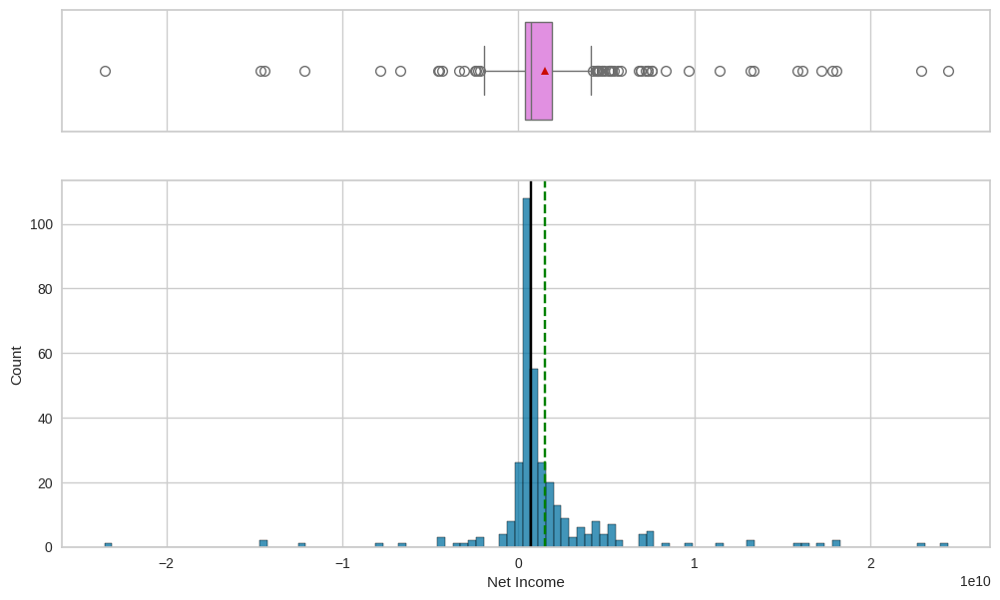

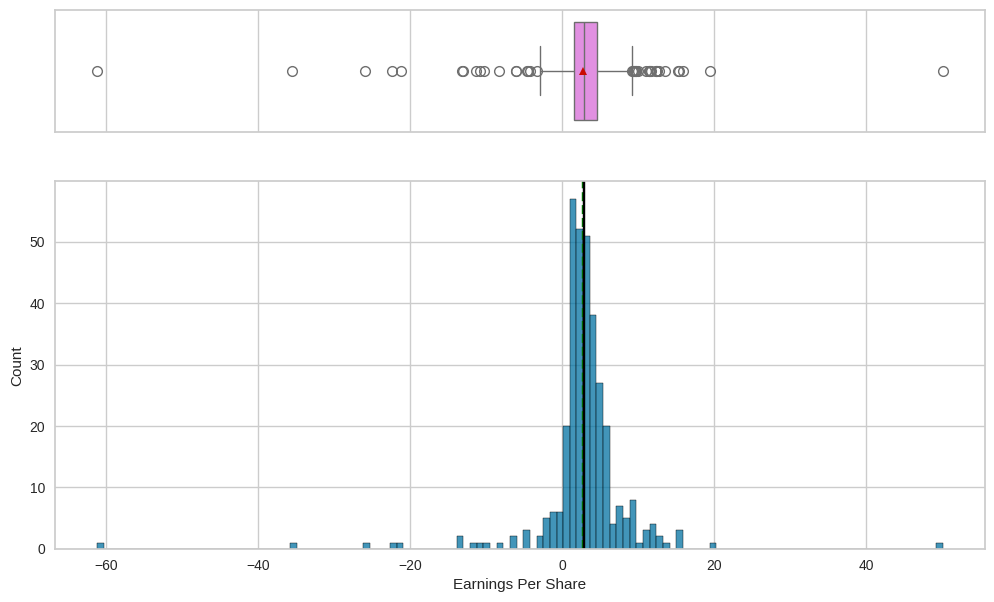

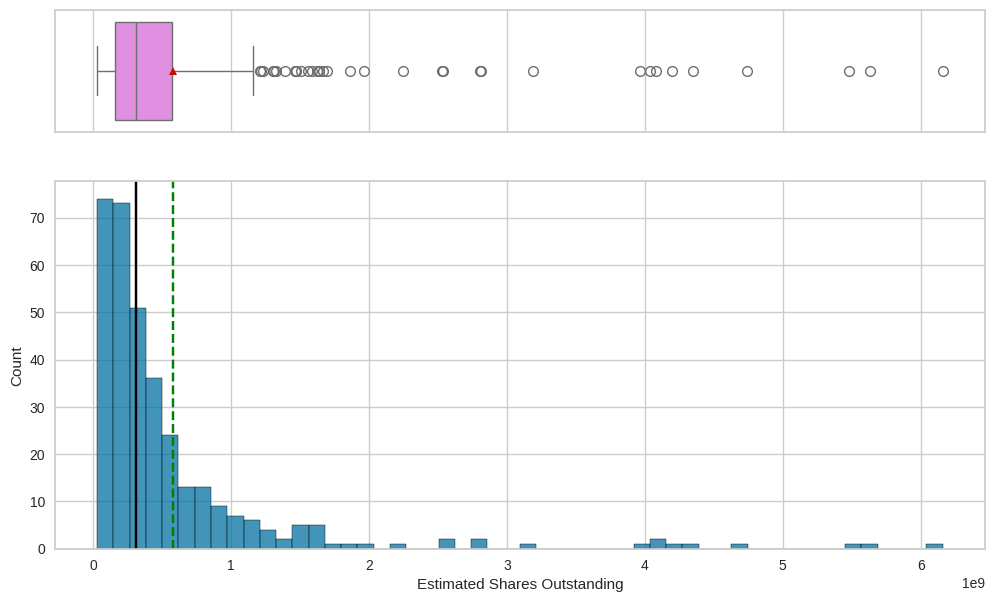

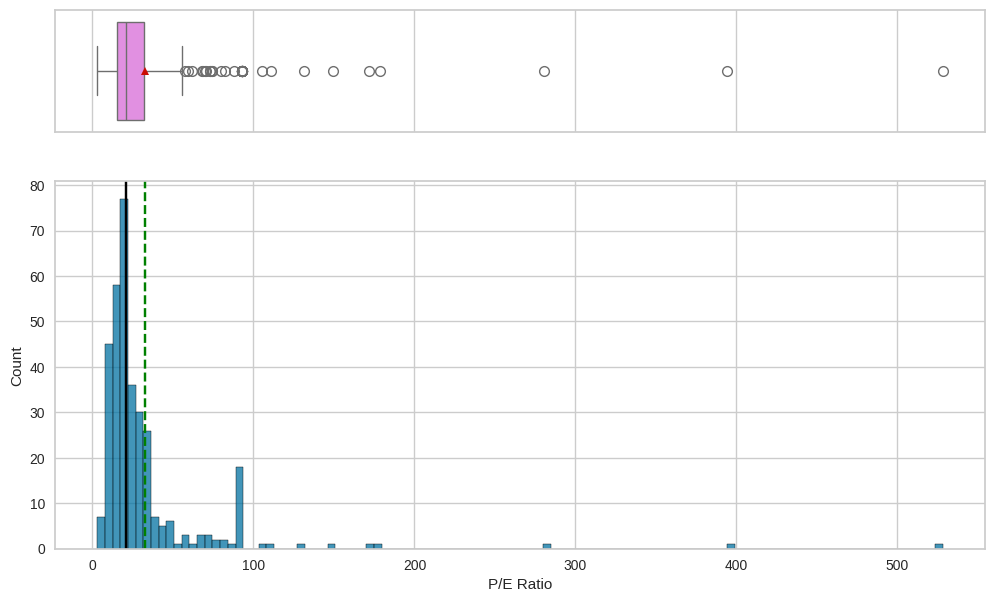

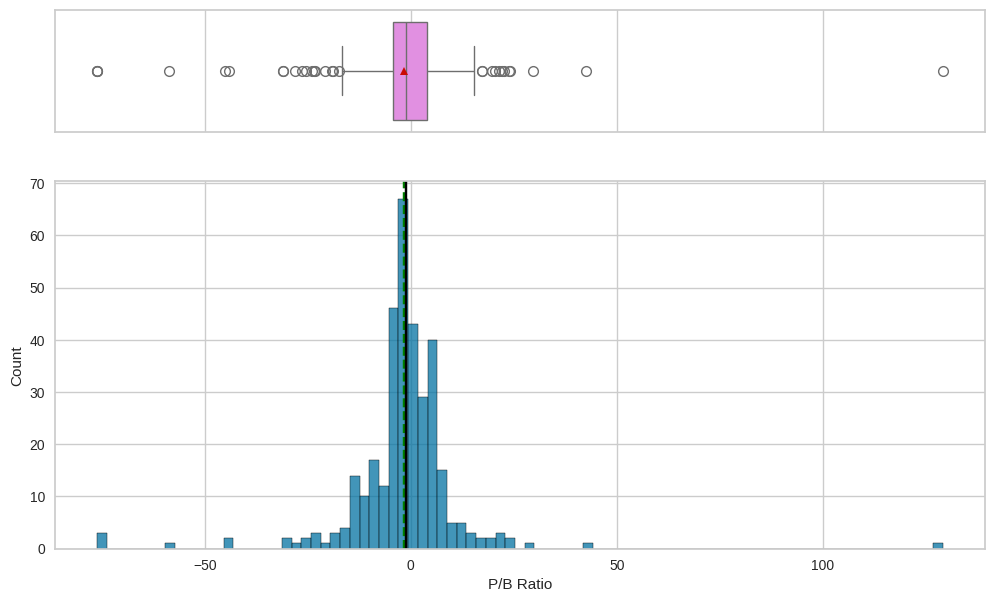

In [36]:
#create list of columns with numerical variables
num_col = df1.select_dtypes(include=np.number).columns.tolist()

#display histograms and boxplots for all numerical columns
for col in num_col:
    histogram_boxplot(df1, col)

Observations on Exploratory Data Analysis (EDA)

The Exploratory Data Analysis (EDA) aims to provide an in-depth understanding of the dataset by examining its main characteristics, identifying patterns, and uncovering relationships between variables. This process is essential for gaining insights that will guide further analysis, including modeling.

1. General Structure and Data Overview
  The dataset consists of 340 rows and 15 columns. The data includes a mix of categorical and numerical variables, with no missing or duplicated values, ensuring data integrity. The categorical variables primarily describe the sector and sub-industry of the companies, while the numerical variables include financial indicators such as stock prices, returns, and financial ratios.

2. Distribution of Variables

  Categorical Variables:
  - Ticker Symbol and Security are unique identifiers for the companies, with each having 340 distinct values. This implies that each entry in the dataset corresponds to a different company.
  - GICS Sector includes 11 unique sectors, with Industrials being the most represented, followed by Financials and Health Care. This distribution may skew the overall analysis, suggesting a potential need for sector-specific insights.
  - GICS Sub Industry is more granular, with 104 unique sub-industries. The most common sub-industry is Oil & Gas Exploration & Production.

  Numerical Variables:
  - Current Price has a right-skewed distribution, with most stock prices concentrated below $200. The presence of outliers suggests a significant variation in stock valuations across companies.
  - Price Change is normally distributed, centered around small positive changes, indicating that while most stocks have modest price changes, a few exhibit extreme fluctuations.
  - Volatility is also right-skewed, with most stocks showing moderate levels of volatility (1-2). Higher volatility suggests higher risk, which is crucial for investors to consider.
  - Return on Equity (ROE) displays a heavily right-skewed distribution, with a mean of 39.60%. The wide range of ROE values suggests diverse levels of financial performance across companies.
  - Cash Ratio is skewed to the right, indicating that most companies have adequate liquidity, though some hold exceptionally high cash reserves relative to their liabilities.
  - Net Cash Flow and Net Income both exhibit significant variability, with a few companies showing extreme positive or negative values, reflecting varying degrees of financial health.
  - Earnings Per Share (EPS) is concentrated around lower values, with a few companies showing very high or negative EPS, indicating a broad range in profitability.
  - P/E Ratio and P/B Ratio also show wide distributions, with some companies trading at high multiples, while others may be undervalued or experiencing financial difficulties.

3. Insights from the Distribution of Variables

  The skewness in Current Price and Volatility suggests that most companies are clustered at lower price points and moderate risk levels, with a few outliers driving much of the variability.
  The high standard deviation in ROE, Net Cash Flow, and Net Income indicates that companies in the dataset are at very different stages in terms of profitability and financial stability.
  The diverse range in P/E Ratio and P/B Ratio underscores the variability in market perceptions of company value, with some stocks being highly valued relative to their earnings and others possibly signaling distress.

4. Correlation Analysis

  The correlation matrix highlights several key relationships:
  Earnings Per Share (EPS) has a strong positive correlation with Net Income and Estimated Shares Outstanding, indicating that larger companies with higher profits tend to have higher EPS.
  Volatility is negatively correlated with Net Income and Earnings Per Share, suggesting that companies with more stable financials tend to be less volatile.
  Current Price shows a moderate positive correlation with Earnings Per Share and P/E Ratio, indicating that higher-priced stocks are often associated with higher earnings and are valued more highly by the market.

5. Sector-Specific Insights

  Information Technology sector shows the highest average price increase, reflecting the growth-oriented nature of this sector. Conversely, the Energy sector has seen a decline, possibly due to market fluctuations or sector-specific challenges.
  Cash Ratio varies significantly across sectors, with the IT and Telecom Services sectors showing the highest averages, highlighting their strong liquidity positions.
  The P/E Ratio is notably high in the Energy sector, suggesting that these stocks might be priced at a premium relative to their earnings, possibly due to expectations of future growth or recovery.

Conclusion

  The EDA reveals that the dataset is diverse, with substantial variability across companies and sectors. The findings emphasize the importance of sector-specific analysis, especially given the skewed distributions and correlations observed. These insights will be crucial for guiding the clustering analysis and further modeling steps in the project.


**Questions**:

1. What does the distribution of stock prices look like?


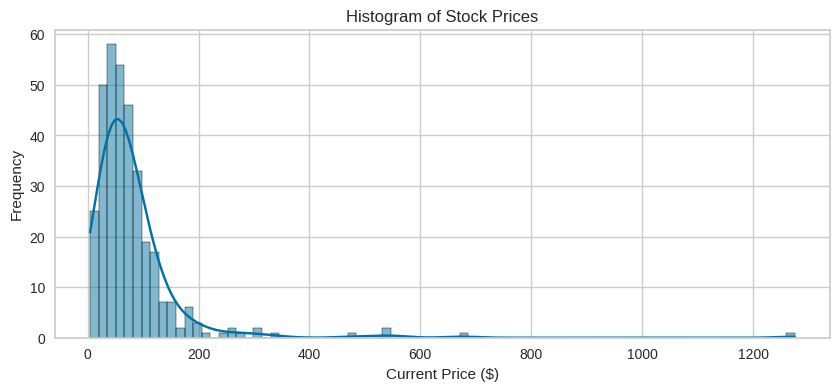

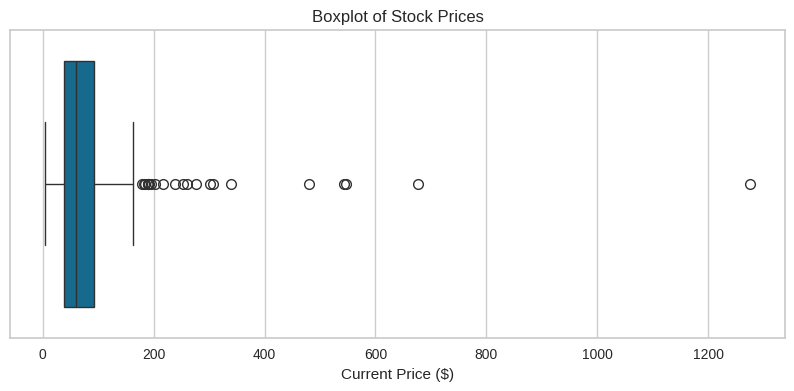

In [37]:
# Histogram
plt.figure(figsize=(10, 4))
sns.histplot(df1['Current Price'], kde=True)
plt.title('Histogram of Stock Prices')
plt.xlabel('Current Price ($)')
plt.ylabel('Frequency')
plt.show()

# Boxplot
plt.figure(figsize=(10, 4))
sns.boxplot(x=df1['Current Price'])
plt.title('Boxplot of Stock Prices')
plt.xlabel('Current Price ($)')
plt.show()


Observations:

The stock prices exhibit a positive skew, with most prices clustered at the lower end of the range and a long tail extending towards higher prices. This suggests that a small number of stocks have significantly higher prices compared to the majority.

2. The stocks of which economic sector have seen the maximum price increase on average?


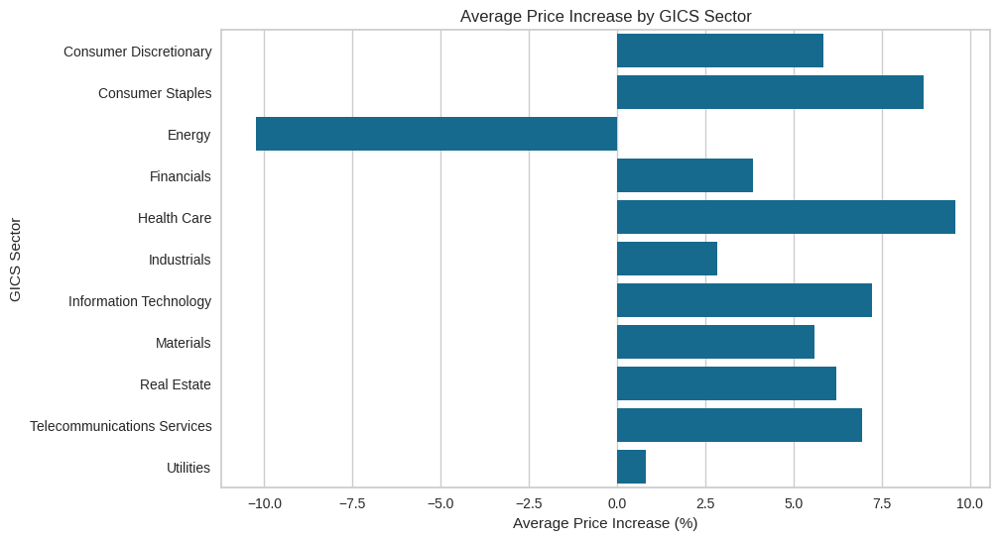

In [38]:
# Group by 'GICS Sector' and calculate the mean 'Price Change'
avg_price_increase_by_sector = df1.groupby('GICS Sector')['Price Change'].mean().reset_index()

# Sort the results
avg_price_increase_by_sector_sorted = avg_price_increase_by_sector.sort_values('Price Change', ascending=False)

# Bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x='Price Change', y='GICS Sector', data=avg_price_increase_by_sector_sorted)
plt.title('Average Price Increase by GICS Sector')
plt.xlabel('Average Price Increase (%)')
plt.ylabel('GICS Sector')
plt.show()

Observations:

The bar chart reveals that, on average, the Information Technology sector has experienced the highest price increase among all GICS sectors, while the Energy sector has seen a decline. Additionally, sectors such as Health Care, Consumer Discretionary, and Materials also show significant average price increases.

3. How are the different variables correlated with each other?


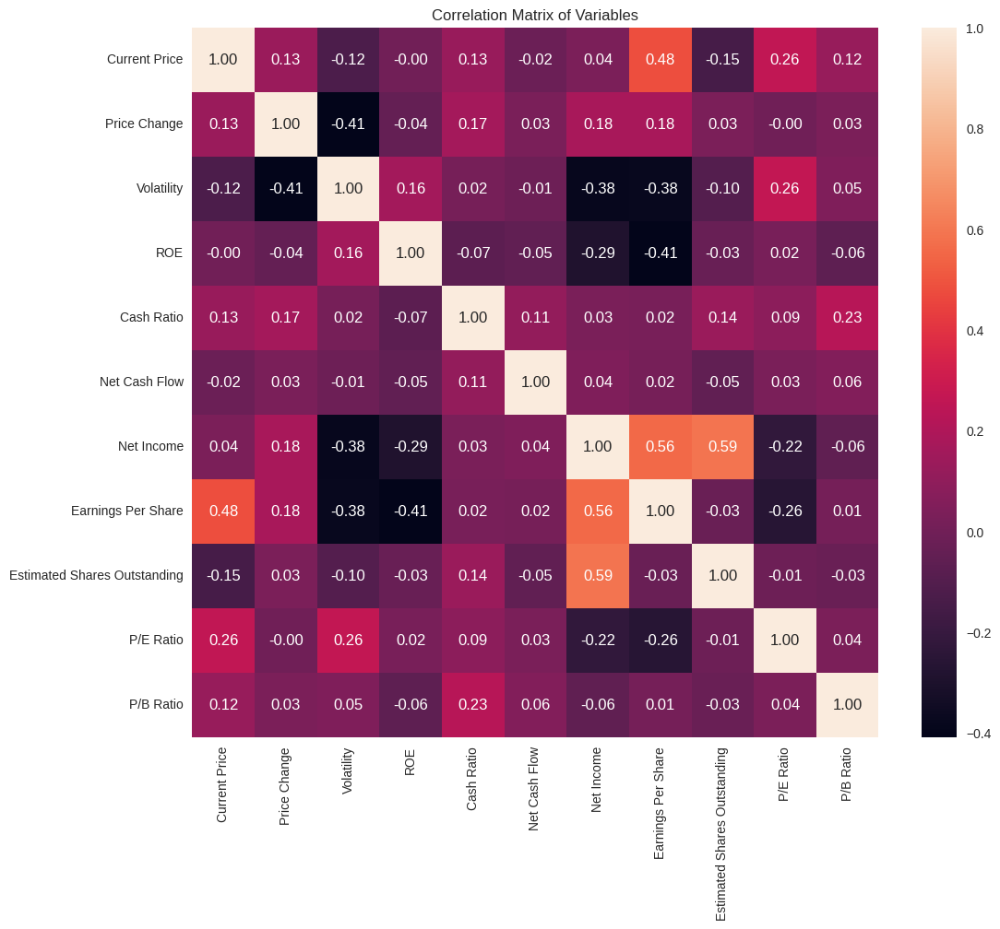

In [39]:
# Select only numeric columns for correlation matrix
numeric_df1 = df1.select_dtypes(include=[np.number])

# Calculate the correlation matrix on numeric columns only
corr = numeric_df1.corr()

# Heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr, annot=True, fmt='.2f')
plt.title('Correlation Matrix of Variables')
plt.show()

Observations:

Current Price and Earnings Per Share (EPS) are moderately positively correlated, suggesting that stocks with higher prices may generally have higher EPS. There is also a notable positive correlation between Net Income and both Earnings Per Share and Estimated Shares Outstanding, indicating that companies with higher net income tend to have higher EPS and possibly a larger number of shares outstanding.

Volatility has a moderate negative correlation with Price Change, implying that stocks with higher volatility may experience smaller average price increases. Return on Equity (ROE) shows little to no correlation with most other metrics, emphasizing its independence as a performance measure. Additionally, the P/E Ratio (Price to Earnings) shows low correlation with other variables, suggesting it is not strongly influenced by the financial metrics analyzed in this dataset.

4. Cash ratio provides a measure of a company's ability to cover its short-term obligations using only cash and cash equivalents. How does the average cash ratio vary across economic sectors?


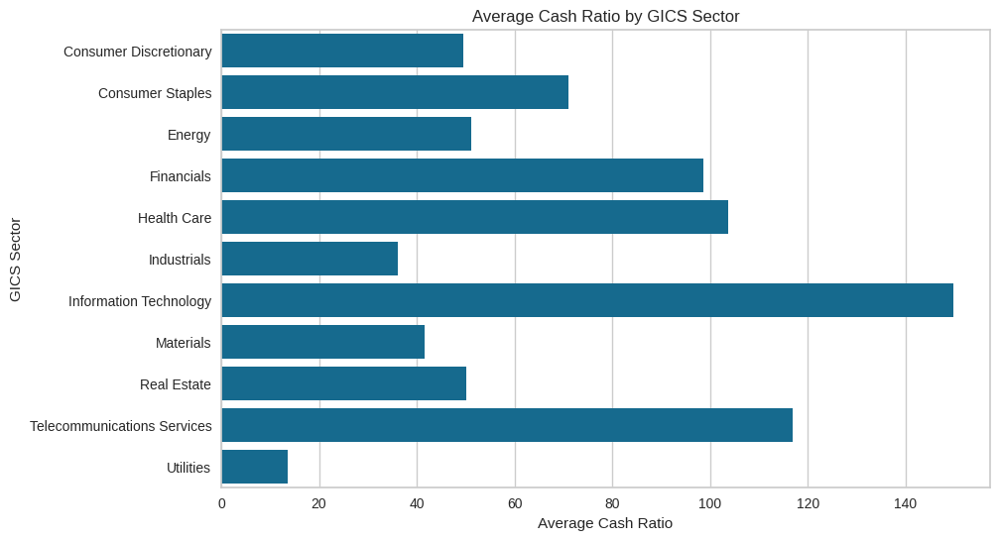

In [40]:
# Calculate the mean 'Cash Ratio' for each 'GICS Sector'
avg_cash_ratio_by_sector = df1.groupby('GICS Sector')['Cash Ratio'].mean().reset_index()

# Bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x='Cash Ratio', y='GICS Sector', data=avg_cash_ratio_by_sector)
plt.title('Average Cash Ratio by GICS Sector')
plt.xlabel('Average Cash Ratio')
plt.ylabel('GICS Sector')
plt.show()

Observations:

The IT and Telecom Services sectors display the highest average cash ratios, emphasizing their strong financial resilience.

5. P/E ratios can help determine the relative value of a company's shares as they signify the amount of money an investor is willing to invest in a single share of a company per dollar of its earnings. How does the P/E ratio vary, on average, across economic sectors?

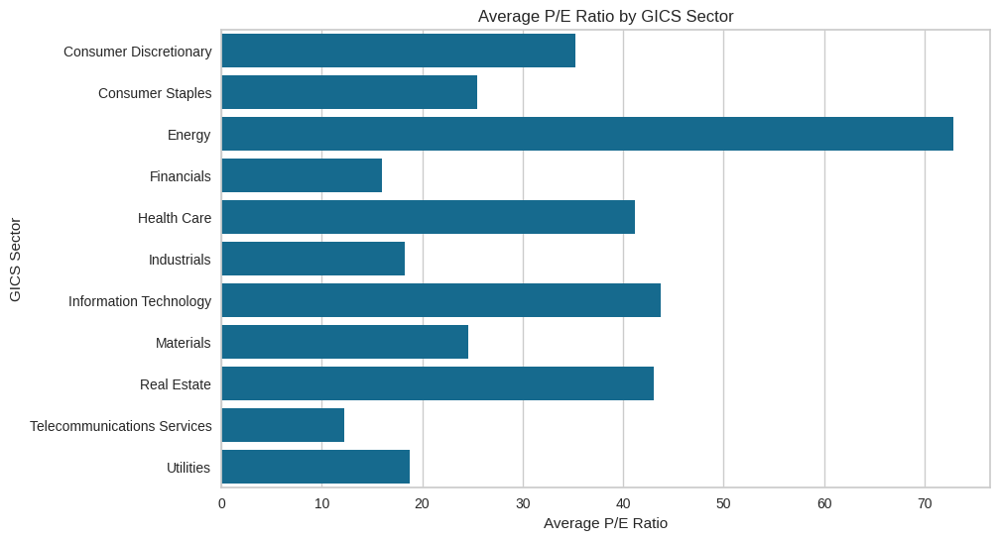

In [41]:
# Calculate the mean 'P/E Ratio' for each 'GICS Sector'
avg_pe_ratio_by_sector = df1.groupby('GICS Sector')['P/E Ratio'].mean().reset_index()

# Bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x='P/E Ratio', y='GICS Sector', data=avg_pe_ratio_by_sector)
plt.title('Average P/E Ratio by GICS Sector')
plt.xlabel('Average P/E Ratio')
plt.ylabel('GICS Sector')
plt.show()

Observations:

A longer bar represents a higher P/E ratio, particularly in the Energy sector, suggesting that, on average, stocks in this sector may be priced at a premium relative to their earnings.

## Data Preprocessing

- Duplicate value check


In [42]:
# checking for duplicate values
df1.duplicated().sum()

0

Observations:

No duplicates. No need to preprocess them.

- Missing value treatment


In [43]:
# checking for missing values
df1.isna().sum()

,0
Security,0
GICS Sector,0
GICS Sub Industry,0
Current Price,0
Price Change,0
Volatility,0
ROE,0
Cash Ratio,0
Net Cash Flow,0
Net Income,0


Observations:

No missing values. No need to preprocess them.

- Outlier check


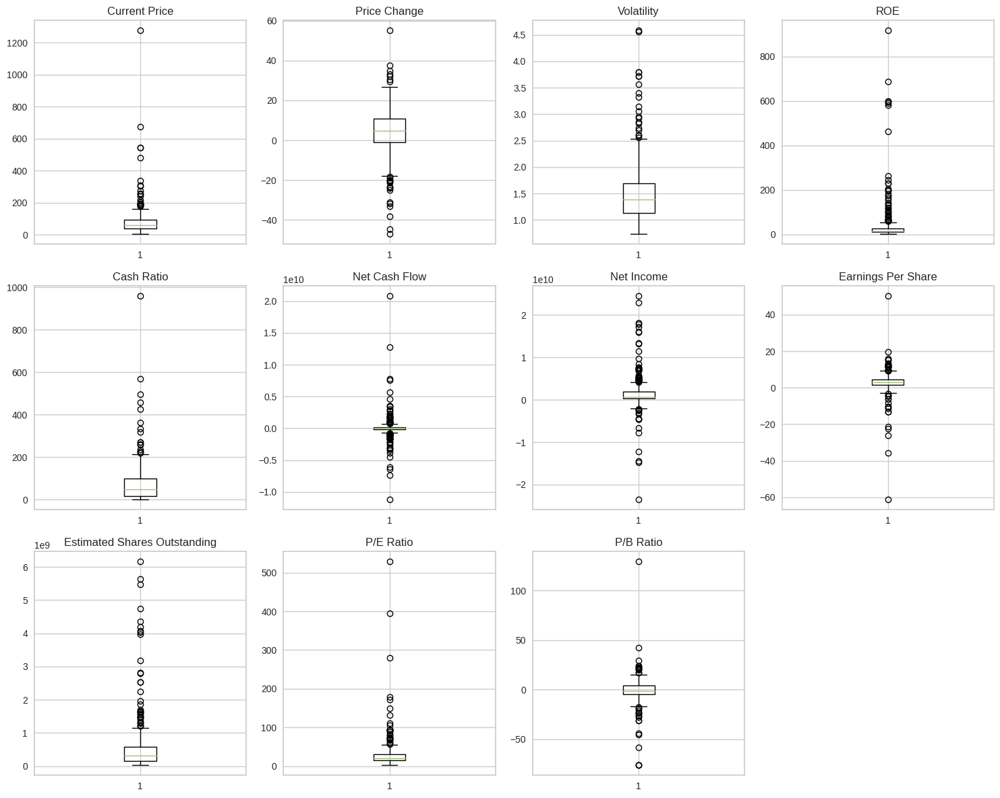

In [44]:
plt.figure(figsize=(15, 12))

num_col = df1.select_dtypes(include=np.number).columns.tolist()

for i, variable in enumerate(num_col):
    plt.subplot(3, 4, i + 1)
    plt.boxplot(df[variable], whis=1.5)
    plt.tight_layout()
    plt.title(variable)

plt.show()

Observations:

Based on previous analysis, the distribution and skewness of the data remain consistent even after removing the outliers, suggesting that it is acceptable to retain them in the analysis.

- Feature engineering (if needed)


No need for further featuring engineering.

- Any other preprocessing steps (if needed)

Ticker Symbol has been already dropped from df1, as it was a unique identified. No need to do it again.

## EDA

- It is a good idea to explore the data once again after manipulating it.

No need to proceed with EDA again, as no manipulation of data is been undertaken after doing EDA for the first time with df1.

## K-means Clustering

I'll scale the data, as KMeans is sensitive to the scale of the features. After scaling, I will apply the KMeans clustering algorithm. I'll also determine the appropriate number of clusters using the elbow method.
Only numerical columns are relevant for this.

In [45]:
# Get a list of the numerical variables
num_var = df1.select_dtypes(include=['int64','float64']).columns
print(num_var)

Index(['Current Price', 'Price Change', 'Volatility', 'ROE', 'Cash Ratio',
       'Net Cash Flow', 'Net Income', 'Earnings Per Share',
       'Estimated Shares Outstanding', 'P/E Ratio', 'P/B Ratio'],
      dtype='object')


In [46]:
# provide statistical summary of all numerical columns
df1.describe().T

,count,mean,std,min,25%,50%,75%,max
Current Price,340.00,80.86,98.06,4.50,38.55,59.70,92.88,1274.95
Price Change,340.00,4.08,12.01,-47.13,-0.94,4.82,10.70,55.05
Volatility,340.00,1.53,0.59,0.73,1.13,1.39,1.70,4.58
ROE,340.00,39.60,96.55,1.00,9.75,15.00,27.00,917.00
Cash Ratio,340.00,70.02,90.42,0.00,18.00,47.00,99.00,958.00
Net Cash Flow,340.00,55537620.59,1946365312.18,-11208000000.00,-193906500.00,2098000.00,169810750.00,20764000000.00
Net Income,340.00,1494384602.94,3940150279.33,-23528000000.00,352301250.00,707336000.00,1899000000.00,24442000000.00
Earnings Per Share,340.00,2.78,6.59,-61.20,1.56,2.90,4.62,50.09
Estimated Shares Outstanding,340.00,577028337.75,845849595.42,27672156.86,158848216.10,309675137.80,573117457.32,6159292035.00
P/E Ratio,340.00,32.61,44.35,2.94,15.04,20.82,31.76,528.04


In [47]:
# Drop categorical variables before scaling
df_num = df1.select_dtypes(include=[np.number])

In [48]:
# Check the new dataframe
df_num.head()

,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio
0,42.35,10.00,1.69,135,51,-604000000,7610000000,11.39,668129938.50,3.72,-8.78
1,59.24,8.34,2.20,130,77,51000000,5144000000,3.15,1633015873.00,18.81,-8.75
2,44.91,11.30,1.27,21,67,938000000,4423000000,2.94,1504421769.00,15.28,-0.39
3,93.94,13.98,1.36,9,180,-240840000,629551000,1.26,499643650.80,74.56,4.20
4,55.32,-1.83,1.70,14,272,315120000,696878000,0.31,2247993548.00,178.45,1.06


Only numerical variables are present, so I can go ahead with scaling, and K-means clustering

In [49]:
# scale the data set before clustering
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_num)

In [50]:
#create a dataframe from the scaled data
scaled_data = pd.DataFrame(scaled_data, columns=df_num.columns)

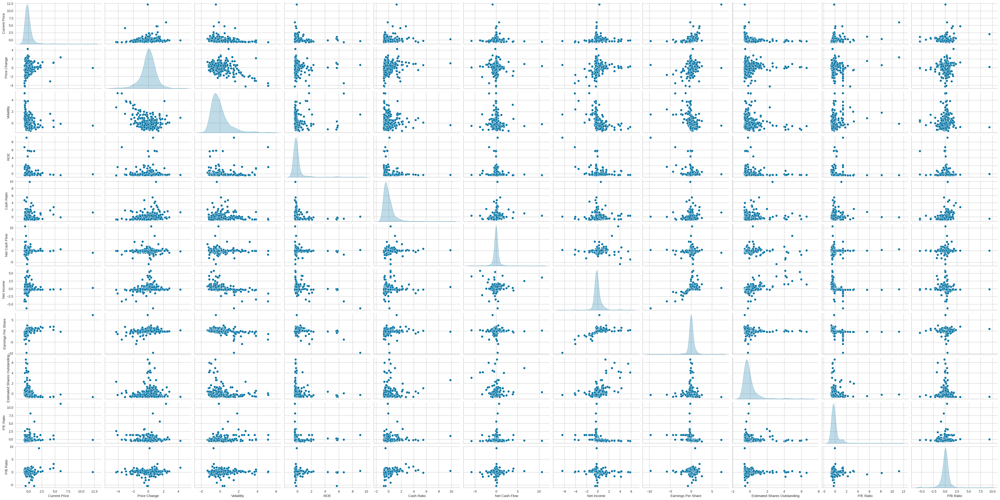

In [51]:
#create pairplot for scaled dataframe
sns.pairplot(scaled_data, height=2,aspect=2 , diag_kind='kde')
plt.show()

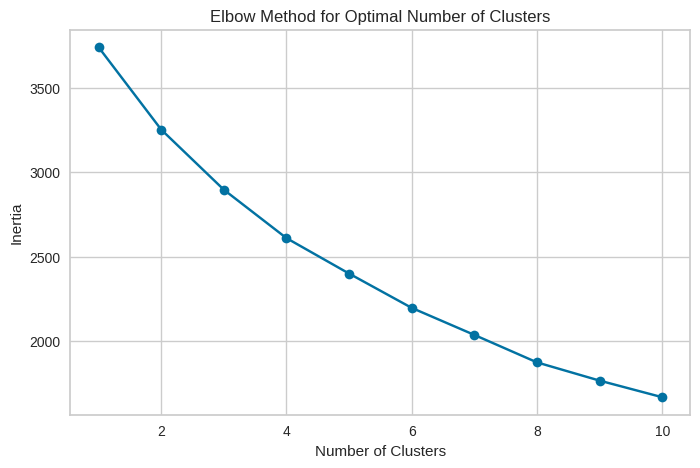

Clustering complete.


In [52]:
# Determine the optimal number of clusters using the elbow method
inertia = []
range_clusters = range(1, 11)

for n_clusters in range_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(scaled_data)
    inertia.append(kmeans.inertia_)

# Plot the elbow curve
plt.figure(figsize=(8, 5))
plt.plot(range_clusters, inertia, marker='o')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.show()

# Based on the elbow method, select the optimal number of clusters
optimal_clusters = 3  # Adjust this number based on the elbow plot

# Fit the KMeans model with the optimal number of clusters
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
df['Cluster'] = kmeans.fit_predict(scaled_data)

print(f"Clustering complete.")

Based on the plot provided, it looks like the "elbow" might be around 4 clusters, where the rate of decrease in inertia starts to slow down.
Let's proceed with the clustering using 4 clusters.

In [53]:
# Set the optimal number of clusters based on the elbow plot
optimal_clusters = 4

# Fit the KMeans model with the chosen number of clusters
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
df['Cluster'] = kmeans.fit_predict(scaled_data)

# Print the number of clusters
print(f"Number of clusters: {optimal_clusters}")

# Print the content of each cluster
for cluster_num in range(optimal_clusters):
    print(f"\nCluster {cluster_num}:")
    print(df[df['Cluster'] == cluster_num])

Number of clusters: 4

Cluster 0:
    Ticker Symbol                     Security             GICS Sector  \
30            APA           Apache Corporation                  Energy   
31            APC      Anadarko Petroleum Corp                  Energy   
44            BHI             Baker Hughes Inc                  Energy   
62            CHK            Chesapeake Energy                  Energy   
76            COG              Cabot Oil & Gas                  Energy   
84            CXO             Concho Resources                  Energy   
102           DVN           Devon Energy Corp.                  Energy   
109           EOG                EOG Resources                  Energy   
112           EQT              EQT Corporation                  Energy   
127           FCX    Freeport-McMoran Cp & Gld               Materials   
153           HES             Hess Corporation                  Energy   
157           HPE   Hewlett Packard Enterprise  Information Technology   
180 

In [54]:
# Calculate the Silhouette Score
silhouette_avg = silhouette_score(scaled_data, df['Cluster'])
print(f"Silhouette Score for {optimal_clusters} clusters: {silhouette_avg}")

Silhouette Score for 4 clusters: 0.45434371948348606


I will check the n of clusters I chose is valid, comparing n of clusters with Silhouette Score:
- Range of Clusters: I evaluate from 2 to 10 clusters because the Silhouette score is undefined for 1 cluster.
- Silhouette Score Calculation: For each number of clusters, we fit the KMeans model, predict the cluster labels, and compute the Silhouette score.
- Plot: The plot shows how the Silhouette score changes as the number of clusters increases, helping to determine the optimal number of clusters.

Silhouette Score for 2 clusters: 0.43969639509980457
Silhouette Score for 3 clusters: 0.46179611378177166
Silhouette Score for 4 clusters: 0.45434371948348606
Silhouette Score for 5 clusters: 0.40999356683171667
Silhouette Score for 6 clusters: 0.41623771926910813
Silhouette Score for 7 clusters: 0.4048166355867718
Silhouette Score for 8 clusters: 0.39429358977480106
Silhouette Score for 9 clusters: 0.12926868390176208
Silhouette Score for 10 clusters: 0.21380304858889432


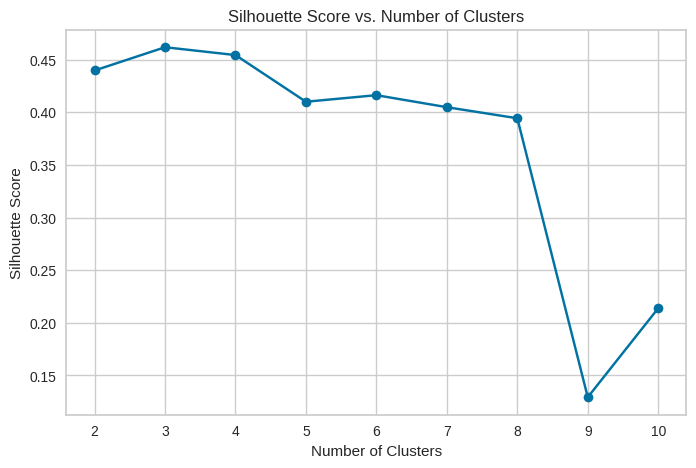

In [55]:
# Range of cluster numbers to evaluate
range_clusters = range(2, 11)  # Starting from 2 because silhouette score is undefined for 1 cluster

# List to store silhouette scores
silhouette_scores = []

# Calculate silhouette scores for each number of clusters
for n_clusters in range_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(scaled_data)
    silhouette_avg = silhouette_score(scaled_data, cluster_labels)
    silhouette_scores.append(silhouette_avg)
    print(f"Silhouette Score for {n_clusters} clusters: {silhouette_avg}")

# Plot the silhouette scores
plt.figure(figsize=(8, 5))
plt.plot(range_clusters, silhouette_scores, marker='o')
plt.title('Silhouette Score vs. Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.show()

Observations:
- The Silhouette score reaches its highest point with 3 clusters, suggesting that this number of clusters provides the best-defined and most well-separated clusters for the given dataset.
- The score remains relatively high with 4 clusters, though it begins to decline, indicating that the clusters become less distinct as the number of clusters increases.
- There is a significant drop in the Silhouette score when the number of clusters is increased to 8, with the lowest score observed at 9 clusters. This suggests that the clustering quality deteriorates substantially beyond 7 clusters.
- The Silhouette score slightly recovers at 10 clusters, but it remains much lower compared to the score for 3 or 4 clusters.

Conclusions:
- The optimal number of clusters for this dataset appears to be 3, as this configuration yields the highest Silhouette score, indicating well-defined and well-separated clusters.
- While 4 clusters also provide a relatively high Silhouette score, the slight drop compared to 3 clusters suggests that 3 clusters may offer a more balanced and distinct separation of data points.
- Clustering with more than 4 clusters, especially 8 and 9, is not recommended as it leads to significantly lower Silhouette scores, indicating that the clusters are less coherent and more mixed.
- It is advisable to proceed with 3 clusters for further analysis and interpretation, though exploring 4 clusters could provide additional insights if more granularity is desired.

I am going to use a silhouette plot as a graphical representation of how well each data point lies within its cluster versus how close it is to the neighboring clusters. I will compare 3 clusters vs 4 clusters before taking the final decision on how mahy clusters are optimal.

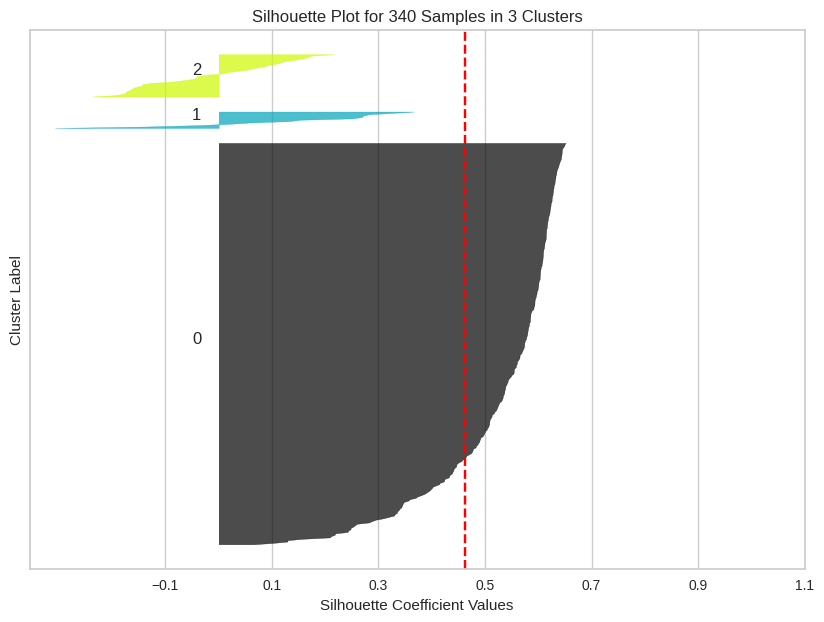

In [56]:
from sklearn.metrics import silhouette_samples, silhouette_score

# Step 1: Fit the KMeans model with the chosen number of clusters
optimal_clusters = 3  # Based on earlier analysis
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(scaled_data)

# Step 2: Calculate the silhouette scores for each sample
silhouette_avg = silhouette_score(scaled_data, cluster_labels)
sample_silhouette_values = silhouette_samples(scaled_data, cluster_labels)

# Step 3: Generate the silhouette plot
plt.figure(figsize=(10, 7))
y_lower = 10
for i in range(optimal_clusters):
    # Aggregate the silhouette scores for samples belonging to cluster i
    ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
    ith_cluster_silhouette_values.sort()

    # Compute the size of the cluster and the position of each silhouette sample
    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    y_upper = y_lower + size_cluster_i

    # Fill the silhouette plot with colors
    color = plt.cm.nipy_spectral(float(i) / optimal_clusters)
    plt.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_silhouette_values,
                     facecolor=color, edgecolor=color, alpha=0.7)

    # Label the silhouette plot with cluster numbers in the middle
    plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

    # Compute the new y_lower for next plot
    y_lower = y_upper + 10  # 10 for the 0 samples

# Red dashed line for average silhouette score
plt.axvline(x=silhouette_avg, color="red", linestyle="--")

plt.title(f"Silhouette Plot for {scaled_data.shape[0]} Samples in {optimal_clusters} Clusters")
plt.xlabel("Silhouette Coefficient Values")
plt.ylabel("Cluster Label")

plt.yticks([])  # Clear the y-axis labels / ticks
plt.xticks(np.arange(-0.1, 1.1, 0.2))

plt.show()

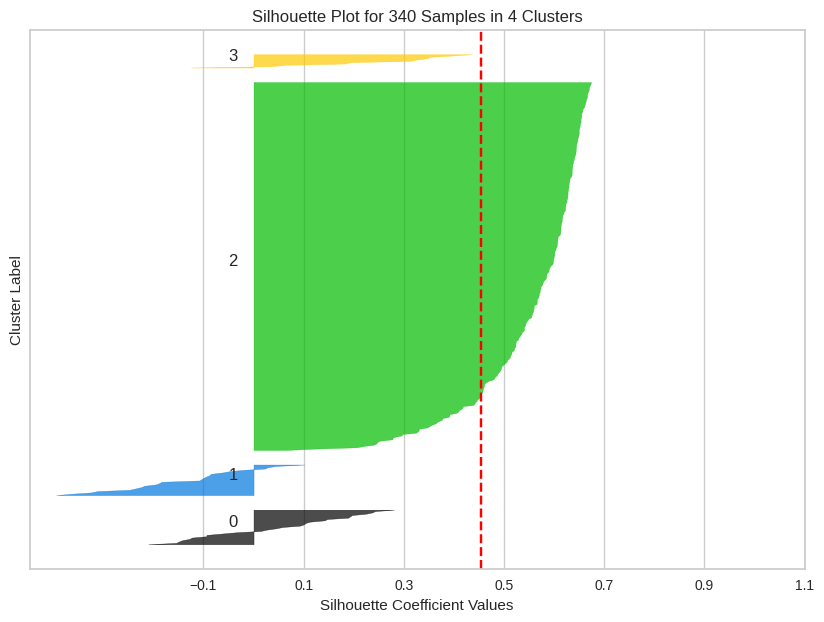

In [57]:
# Step 1: Fit the KMeans model with 4 clusters
optimal_clusters = 4
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(scaled_data)

# Step 2: Calculate the silhouette scores for each sample
silhouette_avg = silhouette_score(scaled_data, cluster_labels)
sample_silhouette_values = silhouette_samples(scaled_data, cluster_labels)

# Step 3: Generate the silhouette plot
plt.figure(figsize=(10, 7))
y_lower = 10
for i in range(optimal_clusters):
    # Aggregate the silhouette scores for samples belonging to cluster i
    ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
    ith_cluster_silhouette_values.sort()

    # Compute the size of the cluster and the position of each silhouette sample
    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    y_upper = y_lower + size_cluster_i

    # Fill the silhouette plot with colors
    color = plt.cm.nipy_spectral(float(i) / optimal_clusters)
    plt.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_silhouette_values,
                     facecolor=color, edgecolor=color, alpha=0.7)

    # Label the silhouette plot with cluster numbers in the middle
    plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

    # Compute the new y_lower for next plot
    y_lower = y_upper + 10  # 10 for the 0 samples

# Red dashed line for average silhouette score
plt.axvline(x=silhouette_avg, color="red", linestyle="--")

plt.title(f"Silhouette Plot for {scaled_data.shape[0]} Samples in {optimal_clusters} Clusters")
plt.xlabel("Silhouette Coefficient Values")
plt.ylabel("Cluster Label")

plt.yticks([])  # Clear the y-axis labels / ticks
plt.xticks(np.arange(-0.1, 1.1, 0.2))

plt.show()


Observations:

- Silhouette Plot for 3 Clusters:
  - Cluster 0: The largest cluster, with most data points having a positive silhouette coefficient. The average silhouette score for this cluster is high, indicating that the points are well-clustered and far from neighboring clusters.
  - Cluster 1: A much smaller cluster compared to Cluster 0. The silhouette coefficients are positive, but closer to zero, suggesting that these points are closer to the decision boundary between clusters, but still fairly well-defined.
  - Cluster 2: The smallest cluster in this configuration. The silhouette coefficients are mostly positive and somewhat higher than those in Cluster 1, indicating that the points in this cluster are better separated from the other clusters.
- Silhouette Plot for 4 Clusters:
  - Cluster 0: A small cluster with many data points having negative silhouette coefficients. This suggests that the points in this cluster are likely misclassified and closer to a neighboring cluster, indicating poor separation.
  - Cluster 1: Similar to Cluster 0, this cluster has several negative silhouette coefficients. The cluster size is small, and the points are not well-separated, leading to a lower cluster quality.
  - Cluster 2: The largest cluster, with a high average silhouette coefficient. The points in this cluster are well-separated and clearly belong to this cluster, making it the strongest cluster in this configuration.
  - Cluster 3: A small cluster with positive silhouette coefficients, suggesting that the points are well-clustered but not as strongly as those in Cluster 2.
- Comparison:
  - The 3-cluster solution has a more uniform distribution of silhouette coefficients across the clusters, with fewer points having negative coefficients. This suggests that the clusters in the 3-cluster configuration are better defined and more distinct.
  - The 4-cluster solution introduces two small clusters (Clusters 0 and 1) that contain a significant number of points with negative silhouette coefficients. This indicates that the introduction of the fourth cluster leads to less distinct separation, with some points being misclassified.
  - The largest cluster in both configurations (Cluster 0 in the 3-cluster plot and Cluster 2 in the 4-cluster plot) remains well-defined, but the introduction of a fourth cluster seems to reduce the overall clustering quality.

Conclusions:
- The 3-cluster solution appears to be the better choice, as it maintains higher silhouette scores across the clusters, with fewer points misclassified. The clusters are more distinct and better defined, which aligns with the optimal number of clusters identified using the elbow method.
- The 4-cluster solution introduces complexity without significant benefits. The additional cluster leads to smaller, less well-defined clusters with lower silhouette scores, indicating poorer separation.

Recommendation:

Proceed with the 3-cluster solution for further analysis and interpretation, as it offers a more balanced and distinct separation of data points. The 4-cluster solution does not add meaningful value and may complicate the clustering interpretation.

Furthermore, I am going to check with  Silhouette Score Elbow Plot for KMeans clustering. This plot shows how the silhouette score and the fit time vary as the number of clusters (k) increases. This will provide insights on computation requirements per cluster size.

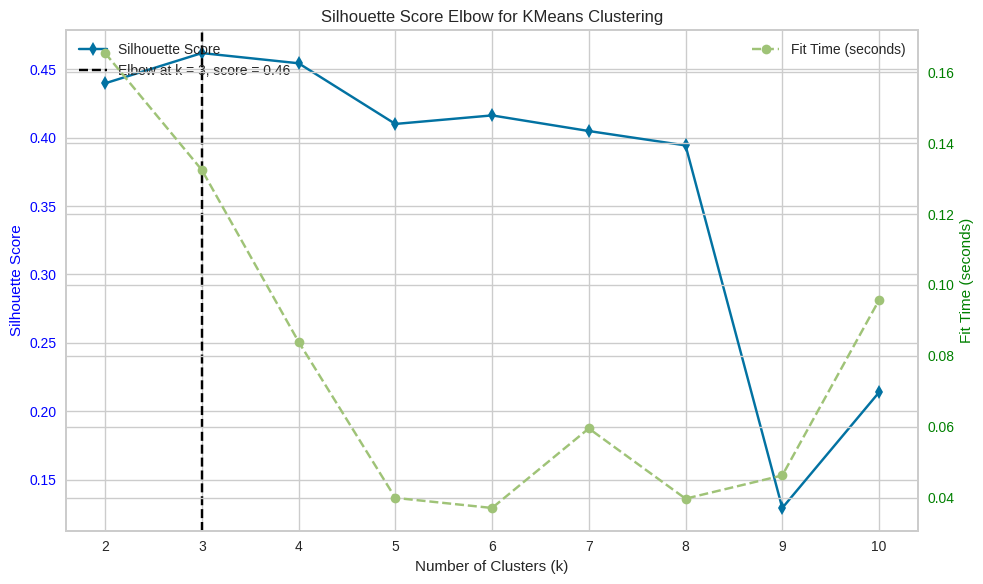

In [58]:
import time

# Range of cluster numbers to evaluate
range_clusters = range(2, 11)  # From 2 to 10 clusters

# Lists to store silhouette scores and fit times
silhouette_scores = []
fit_times = []

# Loop through each cluster count
for n_clusters in range_clusters:
    # Initialize KMeans model
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)

    # Measure fit time
    start_time = time.time()
    cluster_labels = kmeans.fit_predict(scaled_data)
    end_time = time.time()

    # Calculate silhouette score
    silhouette_avg = silhouette_score(scaled_data, cluster_labels)

    # Store the results
    silhouette_scores.append(silhouette_avg)
    fit_times.append(end_time - start_time)

# Plotting the silhouette scores and fit times
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot the silhouette scores
ax1.plot(range_clusters, silhouette_scores, 'b-d', label='Silhouette Score')
ax1.set_xlabel('Number of Clusters (k)')
ax1.set_ylabel('Silhouette Score', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Plot the fit times
ax2 = ax1.twinx()
ax2.plot(range_clusters, fit_times, 'g--o', label='Fit Time (seconds)')
ax2.set_ylabel('Fit Time (seconds)', color='green')
ax2.tick_params(axis='y', labelcolor='green')

# Highlight the elbow point for the best silhouette score
best_k = range_clusters[silhouette_scores.index(max(silhouette_scores))]
best_score = max(silhouette_scores)
ax1.axvline(x=best_k, color='black', linestyle='--', label=f'Elbow at k = {best_k}, score = {best_score:.2f}')

# Add a title and legends
plt.title('Silhouette Score Elbow for KMeans Clustering')
fig.tight_layout()
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.show()


Observations:

- The silhouette score reaches its highest point at k = 3, with a value of approximately 0.46. This indicates that clustering with 3 clusters provides the best-defined clusters according to the silhouette score.
- The silhouette score remains relatively stable and slightly decreases as k increases from 4 to 7, staying around 0.43 to 0.44. This suggests that increasing the number of clusters beyond 3 does not significantly improve clustering quality.
- There is a sharp drop in the silhouette score at k = 8, where the score falls to below 0.25. This indicates that clustering quality deteriorates significantly with 8 clusters.
- The score slightly recovers at k = 9 and k = 10, but these scores remain lower than the score for 3 clusters, indicating that these configurations are suboptimal.
- The fit time increases gradually as the number of clusters increases, peaking at k = 8 and k = 9. This suggests that the computational cost of clustering rises with the number of clusters, especially when k is larger.
- Despite the increase in fit time, the silhouette score does not improve with higher k, further supporting the conclusion that fewer clusters are preferable.
- The elbow point is identified at k = 3, where the silhouette score peaks. This supports the conclusion that 3 clusters provide the best balance between clustering quality and computational efficiency.

Comparison with Previous Recommendations:

- The earlier recommendation based on the silhouette plots for 3 and 4 clusters suggested that 3 clusters was likely the optimal choice, as it offered well-defined and distinct clusters.
- The current Silhouette Score Elbow Plot further reinforces this recommendation, showing that k = 3 not only provides the highest silhouette score but also represents the elbow point where clustering quality is maximized.
- The additional information from the fit time analysis shows that while computational cost increases with more clusters, it does not lead to better clustering quality, particularly beyond k = 3.

Conclusion:
- Recommendation: Based on both the Silhouette Score Elbow Plot and the earlier silhouette plots, 3 clusters should be chosen as the optimal number of clusters for our data. This configuration provides the best-defined clusters with the highest silhouette score, ensuring a good balance between clustering quality and computational efficiency.
- While exploring 4 clusters might provide additional insights, the consistent support for 3 clusters across different analyses makes it the most reliable and effective choice for further analysis and interpretation.

Finally, a chart to check different cluster profilling.

<Figure size 1500x800 with 0 Axes>

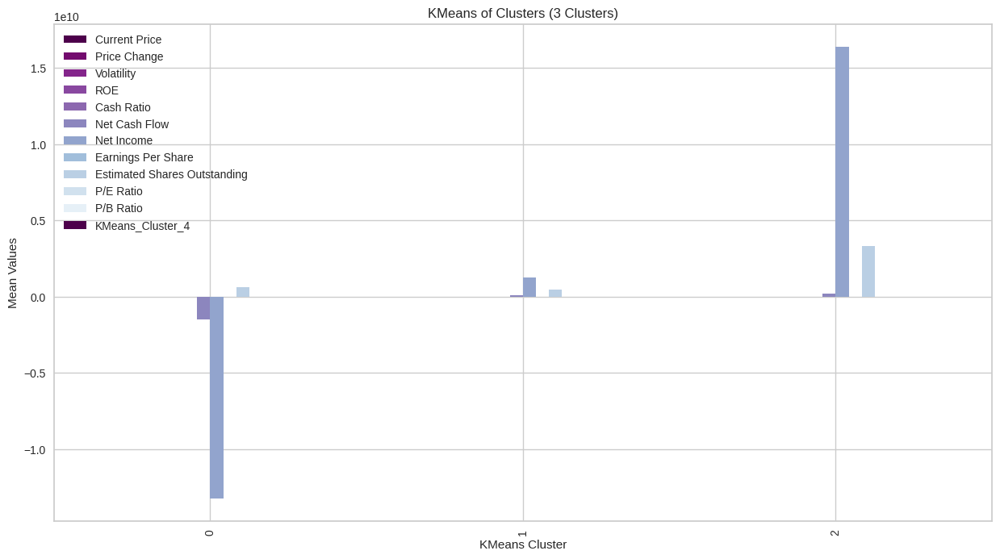

<Figure size 1500x800 with 0 Axes>

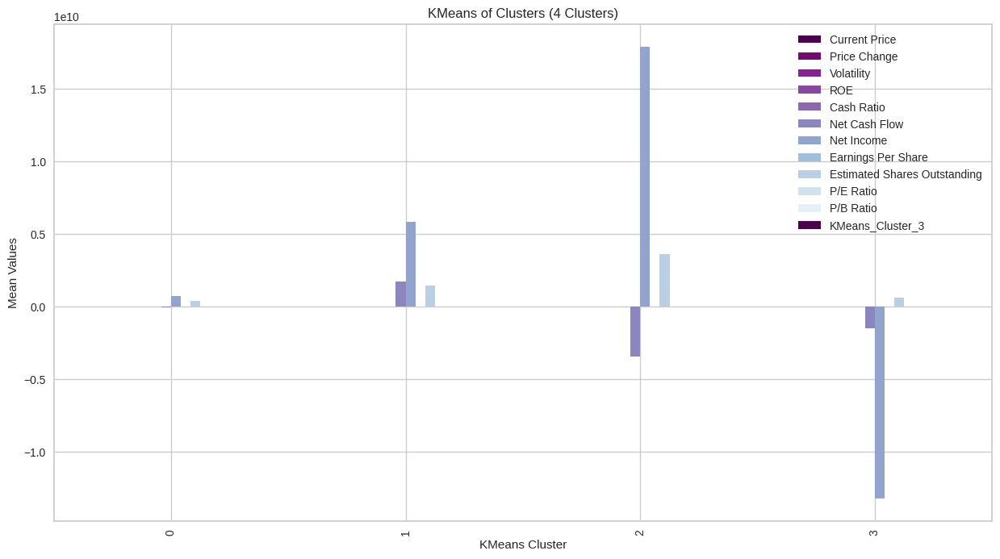

In [59]:
from sklearn.cluster import KMeans

# Step 1: Perform clustering with 3 clusters
kmeans_3 = KMeans(n_clusters=3, random_state=42)
df_num['KMeans_Cluster_3'] = kmeans_3.fit_predict(df_num)

# Step 2: Perform clustering with 4 clusters
kmeans_4 = KMeans(n_clusters=4, random_state=42)
df_num['KMeans_Cluster_4'] = kmeans_4.fit_predict(df_num)

# Step 3: Generate color maps
num_of_bars = len(df_num.columns) - 2  # Subtract 2 for the 'KMeans_Cluster_3' and 'KMeans_Cluster_4' columns
color_map = plt.get_cmap('BuPu_r')
colors = [color_map(1. * i / num_of_bars) for i in range(num_of_bars)]

# Step 4: Plot the bar chart for 3 clusters
plt.figure(figsize=(15, 8))
grouped_means_3 = df_num.groupby("KMeans_Cluster_3").mean()
grouped_means_3.plot.bar(figsize=(15, 8), color=colors)
plt.title("KMeans of Clusters (3 Clusters)")
plt.xlabel("KMeans Cluster")
plt.ylabel("Mean Values")
plt.show()

# Step 5: Plot the bar chart for 4 clusters
plt.figure(figsize=(15, 8))
grouped_means_4 = df_num.groupby("KMeans_Cluster_4").mean()
grouped_means_4.plot.bar(figsize=(15, 8), color=colors)
plt.title("KMeans of Clusters (4 Clusters)")
plt.xlabel("KMeans Cluster")
plt.ylabel("Mean Values")
plt.show()


The elbow plot shows the inertia (within-cluster sum of squares) for different numbers of clusters. The "elbow" point, where the rate of decrease sharply slows, can suggest the optimal number of clusters. Based on the plot, you can choose the number of clusters. Typically, this is where the curve starts to flatten out.

Observations:
- KMeans with 3 Clusters:
    - Cluster 0: This cluster is characterized by extremely high mean values for Net Income and Current Price, indicating that companies in this group are likely to be well-established with strong financial performance. These companies may offer stable investment opportunities with significant earnings.
    - Cluster 1: This cluster shows smaller variations in most financial metrics, with slightly negative mean values in Price Change and Cash Ratio. This suggests that companies in this cluster might represent more conservative investments with lower volatility but potentially lower returns.
    - Cluster 2: This cluster displays moderate values across most features, particularly in Current Price and Net Income. The companies in this cluster may represent a middle ground between high-performing and conservative stocks, offering balanced investment opportunities.
- KMeans with 4 Clusters:
    - Cluster 0: Similar to Cluster 1 in the 3-cluster model, with modest values in financial metrics. The introduction of a fourth cluster seems to further differentiate companies with moderate performance, particularly in Net Income.
    - Cluster 1: This cluster displays characteristics similar to Cluster 2 in the 3-cluster model but with a clearer distinction in features such as Net Cash Flow and Current Price. This suggests a more refined grouping of companies with consistent financial performance.
    - Cluster 2: This cluster resembles Cluster 0 from the 3-cluster model, representing high-performing companies with very high mean values in Net Income. This grouping emphasizes companies with strong earnings, possibly representing safer, high-value investments.
    - Cluster 3: This cluster introduces companies with negative mean values in ROE, indicating weaker financial performance. These companies might be riskier investments, potentially offering lower returns or requiring closer scrutiny before investment.
- Comparison:
    - The 3-cluster model provides broader categories, which may simplify the investment decision process by highlighting distinctly different groups of companies (high-performing, moderate, and conservative). The 3-cluster model, on the other hand, might be more effective for investors looking for broader diversification strategies without the need for highly detailed distinctions between companies.
    - The 4-cluster model offers a more granular breakdown, particularly separating companies with poor financial performance (Cluster 3) and refining the grouping of companies with moderate to strong performance. The 4-cluster model’s additional cluster may be valuable for identifying riskier investments (Cluster 3), which were previously grouped with more stable companies in the 3-cluster model.

Recommendations:
  - The 3-cluster model is recommended if the goal is to categorize stocks into broad groups representing high-performing, moderate, and conservative investment options. This approach allows for straightforward diversification across these categories, making it easier to balance risk and return in a portfolio.
  - The 4-cluster model is preferable if the goal is to perform a more detailed analysis of the stock market, particularly to identify and manage investments in riskier companies. The additional cluster (Cluster 3) highlights companies with weaker financial metrics, which could be crucial for investors who need to be cautious about potential downside risks.

If Trade&Ahead aims to provide clients with a high-level, easily understandable investment strategy, the 3-cluster model should be adopted. It offers clear differentiation between different types of stocks and allows investors to allocate funds according to their risk tolerance and financial goals.
If the consultancy seeks to provide a more tailored, detailed investment strategy that accounts for varying degrees of financial performance, the 4-cluster model will be more beneficial. It enables a deeper analysis of stocks, helping to identify niche opportunities or avoid potentially underperforming investments.
In conclusion, the choice between the 3-cluster and 4-cluster models should align with the specific investment objectives of Trade&Ahead's clients, balancing the need for simplicity versus the need for detailed risk assessment and stock performance analysis.

As Trade&Ahead is a financial consultancy firm who provide their customers with personalized investment strategies, I will choose 4 clusters, and will go ahead with Cluster Profilling.

In [60]:
# Perform clustering with 4 clusters
kmeans_4 = KMeans(n_clusters=4, random_state=42)
df1['KMeans_Cluster_4'] = kmeans_4.fit_predict(df_num)

# Verify that the 'KMeans_Cluster_4' column has been added
print(df1.head())

                  Security             GICS Sector      GICS Sub Industry  \
0  American Airlines Group             Industrials               Airlines   
1                   AbbVie             Health Care        Pharmaceuticals   
2      Abbott Laboratories             Health Care  Health Care Equipment   
3        Adobe Systems Inc  Information Technology   Application Software   
4     Analog Devices, Inc.  Information Technology         Semiconductors   

   Current Price  Price Change  Volatility  ROE  Cash Ratio  Net Cash Flow  \
0          42.35         10.00        1.69  135          51     -604000000   
1          59.24          8.34        2.20  130          77       51000000   
2          44.91         11.30        1.27   21          67      938000000   
3          93.94         13.98        1.36    9         180     -240840000   
4          55.32         -1.83        1.70   14         272      315120000   

   Net Income  Earnings Per Share  Estimated Shares Outstanding  P/E

In cluster 1, the following companies are present:
['American Airlines Group', 'AbbVie', 'Abbott Laboratories', 'Amgen Inc', 'American Express Co', 'Boeing Company', 'Bank of America Corp', 'Capital One Financial', 'CVS Health', 'Chevron Corp.', 'Delta Air Lines', 'The Walt Disney Company', 'Exelon Corp.', 'Ford Motor', 'Facebook', 'General Motors', "Honeywell Int'l Inc.", 'Hewlett Packard Enterprise', 'HP Inc.', 'Intel Corp.', 'Coca Cola Company', 'LyondellBasell', 'Mastercard Inc.', "McDonald's Corp.", 'Mondelez International', 'MetLife Inc.', '3M Company', 'Altria Group Inc', 'Merck & Co.', 'PepsiCo Inc.', 'Pfizer Inc.', 'Philip Morris International', 'PNC Financial Services', 'Prudential Financial', 'United Continental Holdings', 'United Health Group Inc.', 'Union Pacific', 'United Parcel Service', 'United Technologies', 'Valero Energy']

In cluster 0, the following companies are present:
['Adobe Systems Inc', 'Analog Devices, Inc.', 'Archer-Daniels-Midland Co', 'Alliance Data Syst

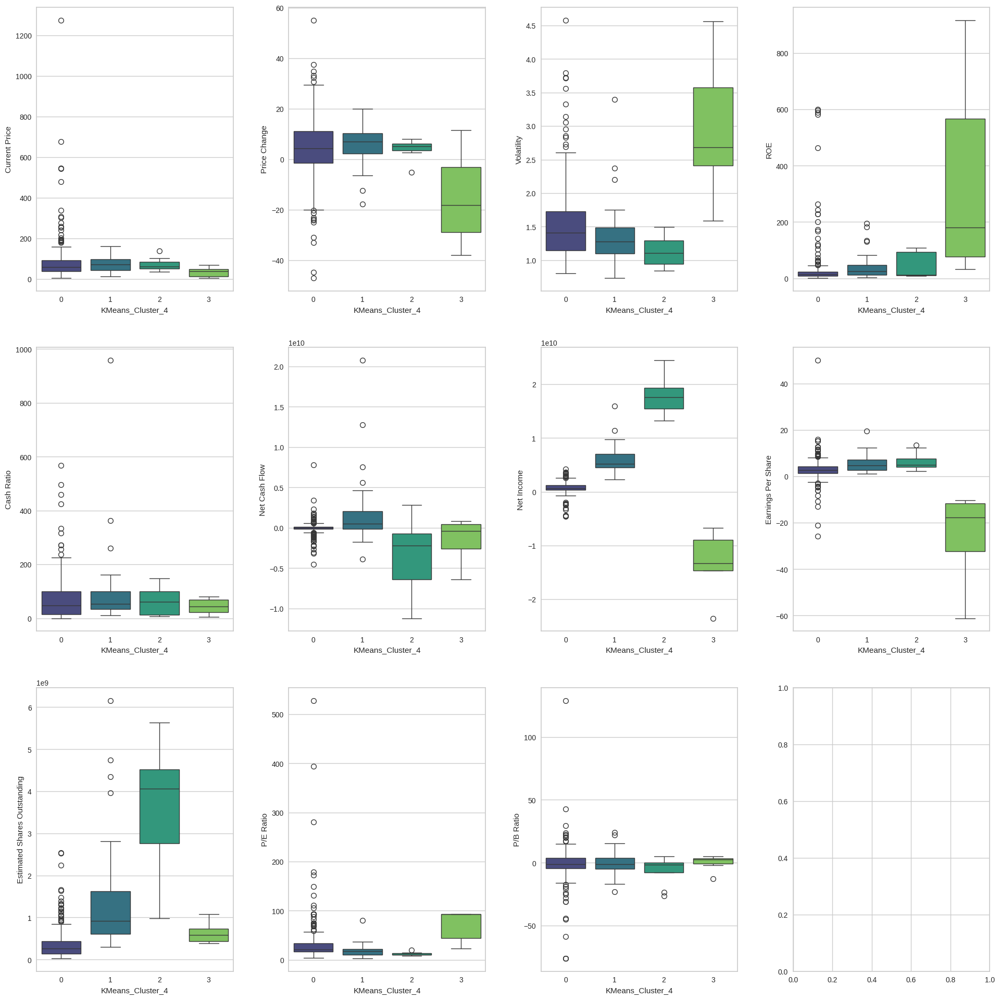

In [61]:
# Step 1: Select numerical columns only and group the dataset by KMeans cluster labels
numerical_columns = df1.select_dtypes(include=[float, int]).columns  # Select only numerical columns
cluster_profile = df1.groupby("KMeans_Cluster_4")[numerical_columns].mean()

# Step 2: Add counts for the number of stocks in each cluster
cluster_profile["Count"] = df1.groupby("KMeans_Cluster_4")["Current Price"].count().values

# Display the profile with highlighted maximum values
cluster_profile.style.highlight_max(color="lightblue", axis=0)

# Step 3: Print the names of the companies in each cluster
for cl in df1["KMeans_Cluster_4"].unique():
    print(f"In cluster {cl}, the following companies are present:")
    print(df1[df1["KMeans_Cluster_4"] == cl]["Security"].unique().tolist())
    print()

# Step 4: Print the number of stocks within each sector for all clusters
for k in range(0, df1['KMeans_Cluster_4'].nunique()):
    print(f'The number of stocks within each GICS Sector for Cluster {k} are:')
    print(df1[df1['KMeans_Cluster_4'] == k]['GICS Sector'].value_counts())
    print("   ")

# Step 5: Show boxplots of numerical variables for each K-Means cluster
fig, axes = plt.subplots(3, 4, figsize=(20, 20))
counter = 0

for ii in range(3):
    for jj in range(4):
        if counter < len(numerical_columns) - 1:  # Exclude 'KMeans_Cluster_4'
            sns.boxplot(
                ax=axes[ii][jj],
                data=df1,
                y=numerical_columns[counter],
                x="KMeans_Cluster_4",
                palette="viridis"
            )
            counter += 1

fig.tight_layout(pad=3.0)
plt.show()


Observations:
- Cluster 0:
    - Companies Present: Cluster 0 includes a diverse range of companies across multiple sectors, such as Adobe Systems Inc, Amazon.com Inc, Procter & Gamble, and Chevron Corp.
    - Sector Distribution: This cluster has the largest number of stocks, with a significant presence in the Industrials (44), Financials (40), Consumer Discretionary (36), and Health Care (33) sectors. It also has representation across 11 sectors, making it the most diversified cluster.
    - Boxplot Insights:
      - Current Price: This cluster shows a relatively stable distribution of stock prices with fewer outliers compared to other clusters.
      - Net Cash Flow: There is a broad range of cash flows, indicating varied cash management practices among companies in this cluster.
      - P/E Ratio: This feature shows a wider range in this cluster, suggesting diverse valuation metrics across the included companies.
- Cluster 1:
    - Companies Present: Cluster 1 includes companies like American Airlines Group, AbbVie, Ford Motor, and Coca-Cola, mostly representing well-established, large-cap stocks.
    - Sector Distribution: The cluster is somewhat diversified but less so than Cluster 0, with significant representation in Industrials (9) and Consumer Staples (6). It has no representation in Real Estate or Telecommunications Services.
    - Boxplot Insights:
      - Price Change: Stocks in this cluster exhibit moderate price changes, with some negative trends.
      - ROE: Companies in this cluster have varying ROE values, with a generally positive range, indicating profitability across most companies.
      - Net Income: There is a broad range of net income, with some companies showing significant earnings.
- Cluster 2:
  - Companies Present: Cluster 2 includes major financial and telecom companies such as Citigroup Inc., JPMorgan Chase & Co., AT&T Inc, and Verizon Communications.
  - Sector Distribution: The cluster is concentrated mainly in Financials (3) and Telecommunications Services (2), with some presence in Energy and Health Care. It is the least diversified in terms of sector representation.
  - Boxplot Insights:
    - Net Income: This cluster shows significant net income values, suggesting strong profitability for the included companies.
    - Estimated Shares Outstanding: There is a wide variation, with some companies having very large share volumes.
    - P/E Ratio: The companies in this cluster tend to have a more consistent P/E ratio compared to other clusters.
- Cluster 3:
  - Companies Present: Cluster 3 is dominated by energy companies such as Apache Corporation, Chesapeake Energy, and Occidental Petroleum.
  - Sector Distribution: This cluster is highly concentrated in the Energy sector (5), with minimal representation in other sectors, making it the least diversified cluster.
  - Boxplot Insights:
    - Volatility: This cluster exhibits high volatility, particularly in stock prices, indicating a higher risk profile.
    - Net Cash Flow: The companies in this cluster show negative cash flows, which could indicate financial instability or heavy capital expenditure.
    - ROE: This cluster has the highest variation in ROE, with some companies showing negative returns, highlighting potential risks.

Recommendations:
- For Diversified Portfolio, Cluster 0 should be considered for investors seeking a diversified portfolio with exposure across multiple sectors. This cluster includes companies with varied financial metrics, offering a balanced mix of risk and return.
- For Stability and Moderate Risk, Cluster 1 represents a group of well-established companies with moderate risk and stable returns. This cluster is suitable for investors looking for stability with moderate growth potential.
- For High Profitability, Cluster 2 is ideal for investors focused on high-profitability companies, particularly in the Financial and Telecommunications sectors. The companies in this cluster have consistent financial performance, making it a good choice for long-term investment.
- For High-Risk, High-Reward, Cluster 3 consists of companies primarily in the Energy sector with high volatility and significant risk. This cluster is suited for investors with a higher risk tolerance, looking for potential high-reward opportunities but also willing to accept the associated risks.


In conclusion, each cluster offers different investment characteristics, and the choice of cluster should align with the investor’s risk tolerance, sector preference, and financial goals. Diversifying across clusters may also help in balancing risk and achieving desired returns.

## Hierarchical Clustering

In [62]:
# Create a new DataFrame without the 'KMeans_Cluster_4' columns
df_HC = df1.drop(columns=['KMeans_Cluster_4'], errors='ignore')

# Display the first few rows of the new DataFrame to confirm
print(df_HC.head())

                  Security             GICS Sector      GICS Sub Industry  \
0  American Airlines Group             Industrials               Airlines   
1                   AbbVie             Health Care        Pharmaceuticals   
2      Abbott Laboratories             Health Care  Health Care Equipment   
3        Adobe Systems Inc  Information Technology   Application Software   
4     Analog Devices, Inc.  Information Technology         Semiconductors   

   Current Price  Price Change  Volatility  ROE  Cash Ratio  Net Cash Flow  \
0          42.35         10.00        1.69  135          51     -604000000   
1          59.24          8.34        2.20  130          77       51000000   
2          44.91         11.30        1.27   21          67      938000000   
3          93.94         13.98        1.36    9         180     -240840000   
4          55.32         -1.83        1.70   14         272      315120000   

   Net Income  Earnings Per Share  Estimated Shares Outstanding  P/E

We can use the linkage function to perform hierarchical clustering. There are various methods like ward, single, complete, and average. Ward's method is generally preferred as it minimizes the variance within clusters.

In [63]:
# Standardize the numerical data from df_HC
scaler = StandardScaler()
numerical_data = df_HC.select_dtypes(include=[np.number])
scaled_data = scaler.fit_transform(numerical_data)

# Define distance metrics and linkage methods
distance_metrics = ["euclidean", "chebyshev", "mahalanobis", "cityblock"]
linkage_methods = ["single", "complete", "average", "weighted"]  # 'centroid' and 'ward' require Euclidean distance

# Mahalanobis distance requires the inverse covariance matrix, so we calculate it once
VI = np.linalg.inv(np.cov(scaled_data.T))

# Dictionary to store cophenetic correlations
cophenetic_corrs = {}

# Iterate over all combinations of distance metrics and linkage methods
for metric in distance_metrics:
    for method in linkage_methods:
        try:
            if metric == "mahalanobis":
                # For Mahalanobis, provide the VI (inverse covariance matrix) to pdist
                dist_matrix = pdist(scaled_data, metric=metric, VI=VI)
            else:
                # For other metrics, just compute the pairwise distances
                dist_matrix = pdist(scaled_data, metric=metric)

            # Perform hierarchical clustering
            Z = linkage(dist_matrix, method=method)

            # Compute cophenetic correlation
            coph_corr, _ = cophenet(Z, dist_matrix)

            # Store the cophenetic correlation
            cophenetic_corrs[(metric, method)] = coph_corr

            # Print the cophenetic correlation
            print(f'Cophenetic Correlation for {method.capitalize()} linkage and {metric.capitalize()} distance: {coph_corr:.4f}')

        except Exception as e:
            print(f"Error with {method} linkage and {metric} distance: {e}")

# Optionally, print the best combination
best_combination = max(cophenetic_corrs, key=cophenetic_corrs.get)
print(f'\nBest combination: {best_combination[1].capitalize()} linkage with {best_combination[0].capitalize()} distance, Cophenetic Correlation: {cophenetic_corrs[best_combination]:.4f}')


Cophenetic Correlation for Single linkage and Euclidean distance: 0.9232
Cophenetic Correlation for Complete linkage and Euclidean distance: 0.7873
Cophenetic Correlation for Average linkage and Euclidean distance: 0.9423
Cophenetic Correlation for Weighted linkage and Euclidean distance: 0.8694
Cophenetic Correlation for Single linkage and Chebyshev distance: 0.8936
Cophenetic Correlation for Complete linkage and Chebyshev distance: 0.6116
Cophenetic Correlation for Average linkage and Chebyshev distance: 0.9445
Cophenetic Correlation for Weighted linkage and Chebyshev distance: 0.9229
Cophenetic Correlation for Single linkage and Mahalanobis distance: 0.9281
Cophenetic Correlation for Complete linkage and Mahalanobis distance: 0.8244
Cophenetic Correlation for Average linkage and Mahalanobis distance: 0.9393
Cophenetic Correlation for Weighted linkage and Mahalanobis distance: 0.8889
Cophenetic Correlation for Single linkage and Cityblock distance: 0.9008
Cophenetic Correlation for C

Observations:
- Single Linkage:
    - Euclidean Distance: The cophenetic correlation of 0.9232 indicates that single linkage with Euclidean distance preserves the original distances relatively well, showing a strong hierarchical structure.
    - Chebyshev Distance: The cophenetic correlation of 0.8936 is slightly lower than Euclidean but still demonstrates a good preservation of the data structure.
    - Mahalanobis Distance: The cophenetic correlation of 0.9281 is the highest among single linkage methods, suggesting that Mahalanobis distance works well with single linkage.
    - Cityblock Distance: The cophenetic correlation of 0.9008 indicates a good but not the best performance among the single linkage combinations.
- Complete Linkage:
    - Euclidean Distance: The cophenetic correlation of 0.7873 is moderate, suggesting that complete linkage with Euclidean distance does not preserve the original data structure as well as other methods.
    - Chebyshev Distance: The lowest cophenetic correlation of 0.6116 among all tested combinations, indicating that this combination does not perform well in preserving the hierarchical structure.
    - Mahalanobis Distance: The correlation of 0.8244 is better than Euclidean and Chebyshev, but still not ideal compared to other linkage methods.
    - Cityblock Distance: The cophenetic correlation of 0.7538 shows that complete linkage with Cityblock distance is not highly effective at preserving the original distances.
- Average Linkage:
    - Euclidean Distance: The cophenetic correlation of 0.9423 is quite high, showing that average linkage with Euclidean distance is effective at maintaining the original pairwise distances.
    - Chebyshev Distance: With the highest cophenetic correlation of 0.9445, this combination is the best among all tested methods, suggesting that it most accurately preserves the data's hierarchical structure.
    - Mahalanobis Distance: The correlation of 0.9393 is also very high, showing that average linkage with Mahalanobis distance is a strong performer.
    - Cityblock Distance: The cophenetic correlation of 0.9261 is still strong, but not as high as Chebyshev and Mahalanobis distances.
- Weighted Linkage:
    - Euclidean Distance: The cophenetic correlation of 0.8694 is decent but lower than average linkage methods, indicating a moderate preservation of the original structure.
    - Chebyshev Distance: The correlation of 0.9229 is high, showing that weighted linkage with Chebyshev distance works well, though slightly lower than average linkage.
    - Mahalanobis Distance: The correlation of 0.8889 suggests that this combination also performs well but is not as strong as average linkage.
    - Cityblock Distance: The cophenetic correlation of 0.7579 is one of the lower results, indicating that weighted linkage with Cityblock distance may not be the best choice.

Conclusion:
- The best combination for hierarchical clustering in this analysis is Average linkage with Chebyshev distance, which achieved the highest cophenetic correlation of 0.9445. This combination best preserves the original pairwise distances and is recommended for further analysis.
- Average linkage consistently performs well across all distance metrics, indicating that it is a robust method for hierarchical clustering.
- Complete linkage, especially with Chebyshev distance, appears to be less effective at preserving the original data structure, as indicated by its lower cophenetic correlations.
- Single linkage methods perform reasonably well, particularly with Mahalanobis and Euclidean distances, but are generally outperformed by average linkage.
- Weighted linkage is also effective but does not outperform average linkage, making the latter the preferred method.

Based on these observations, using Average linkage with Chebyshev distance would be the most effective approach for your hierarchical clustering analysis.

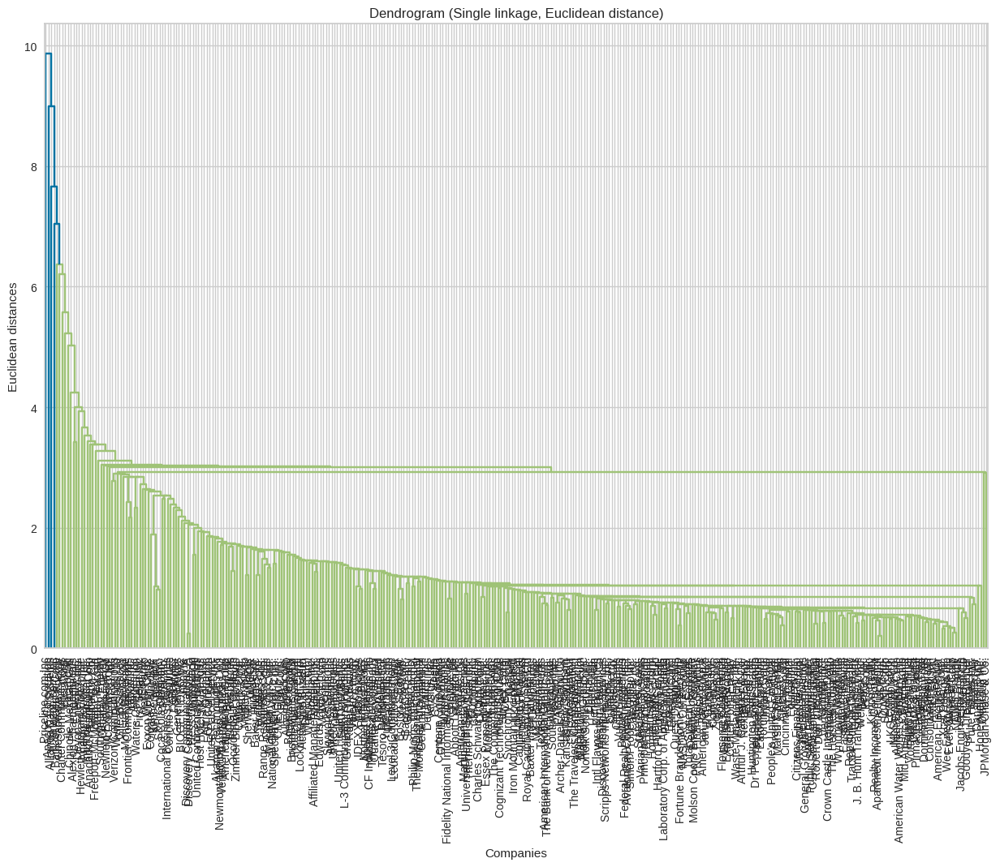

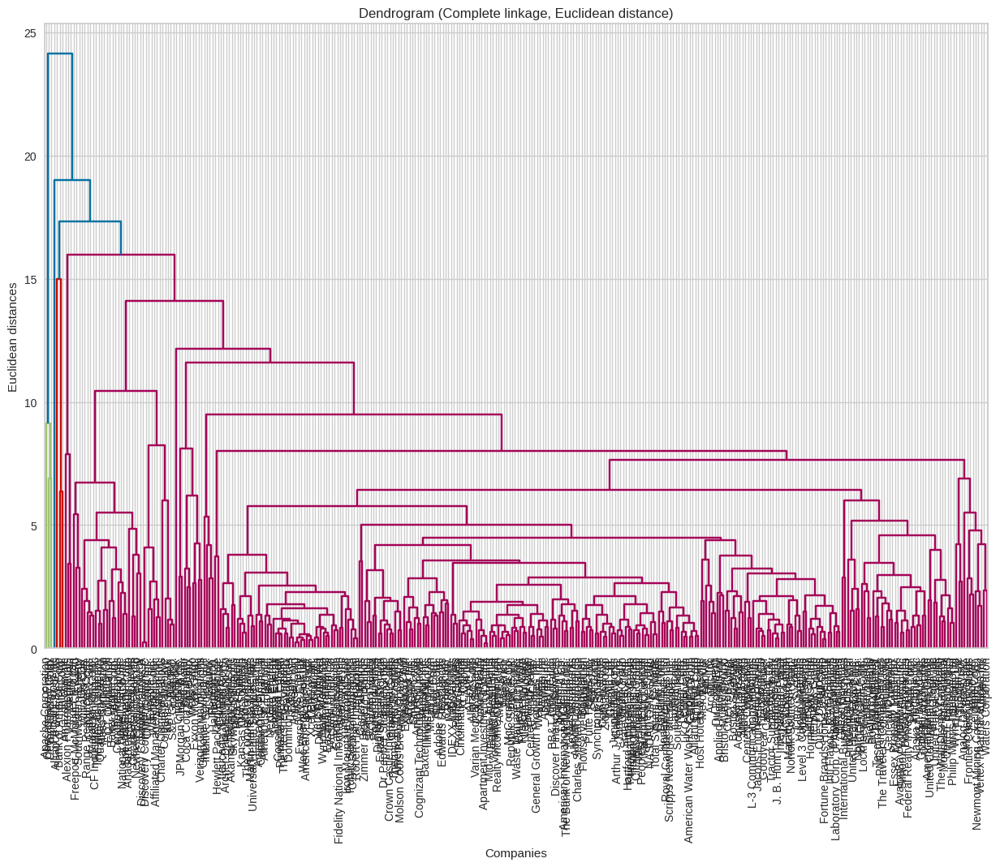

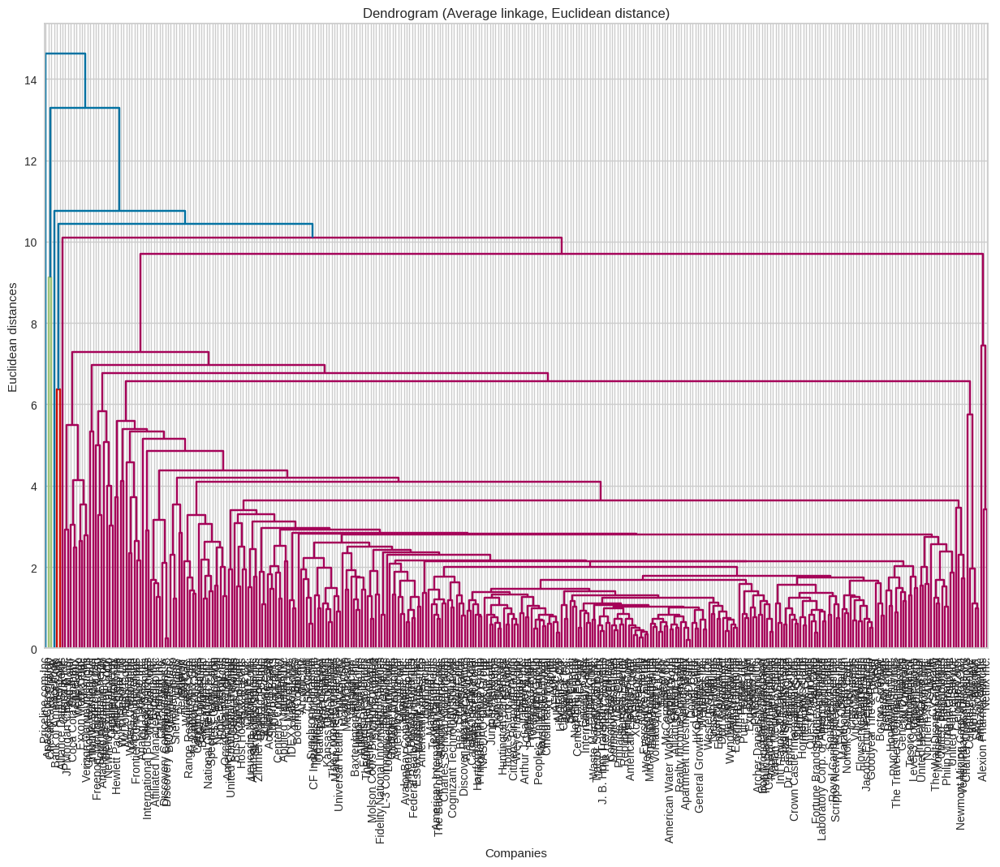

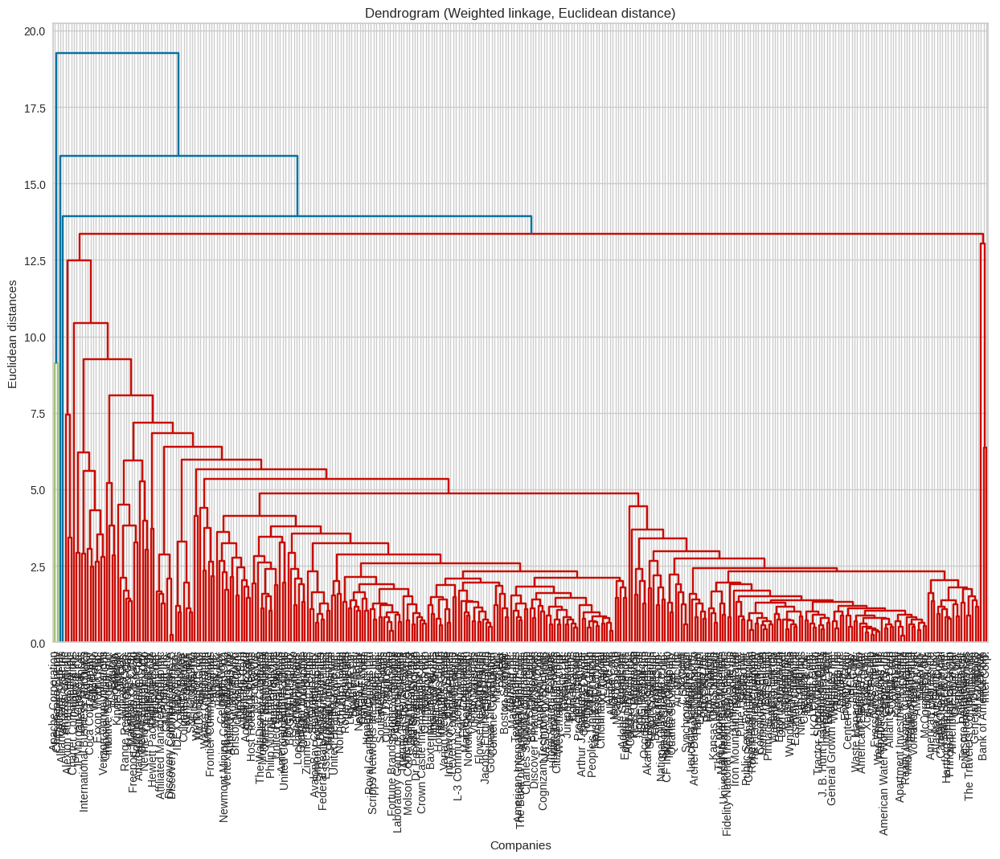

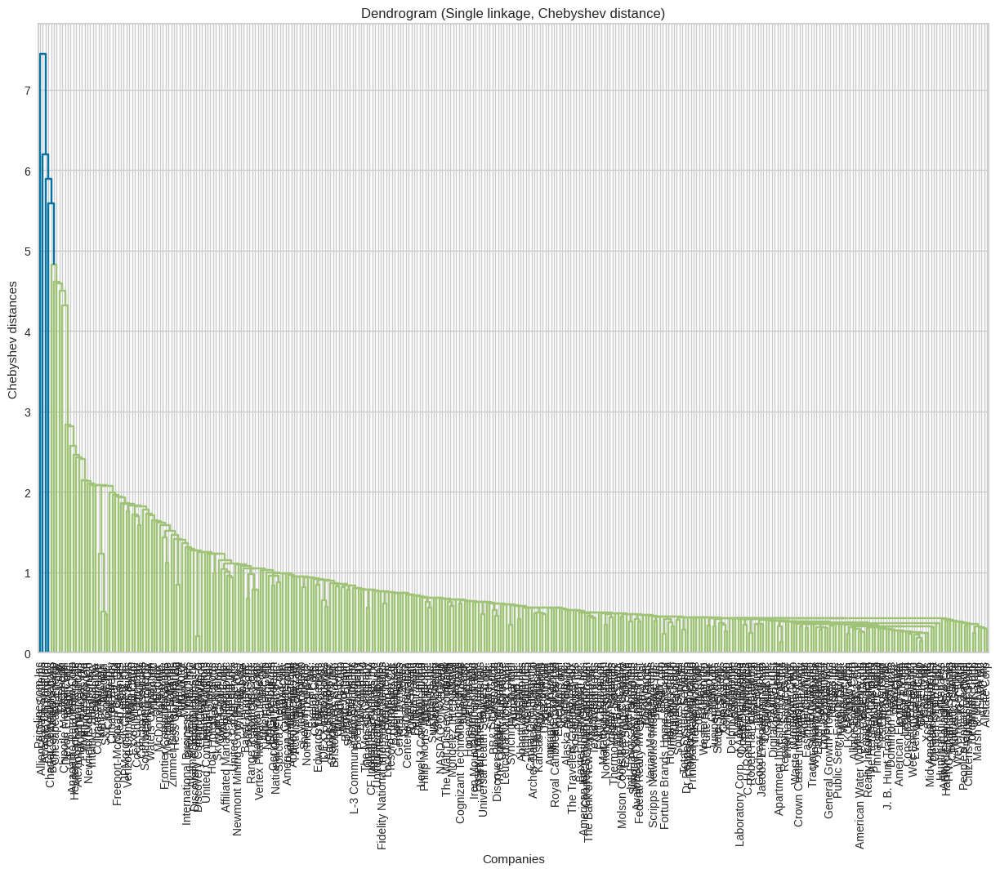

...

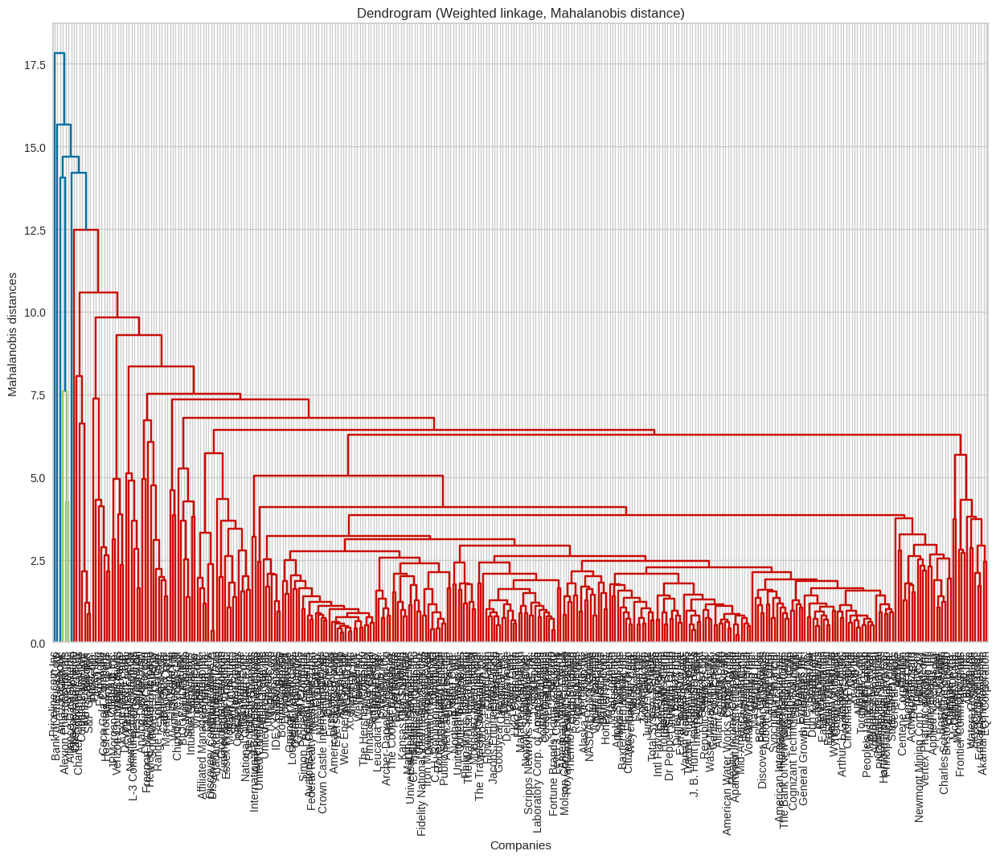

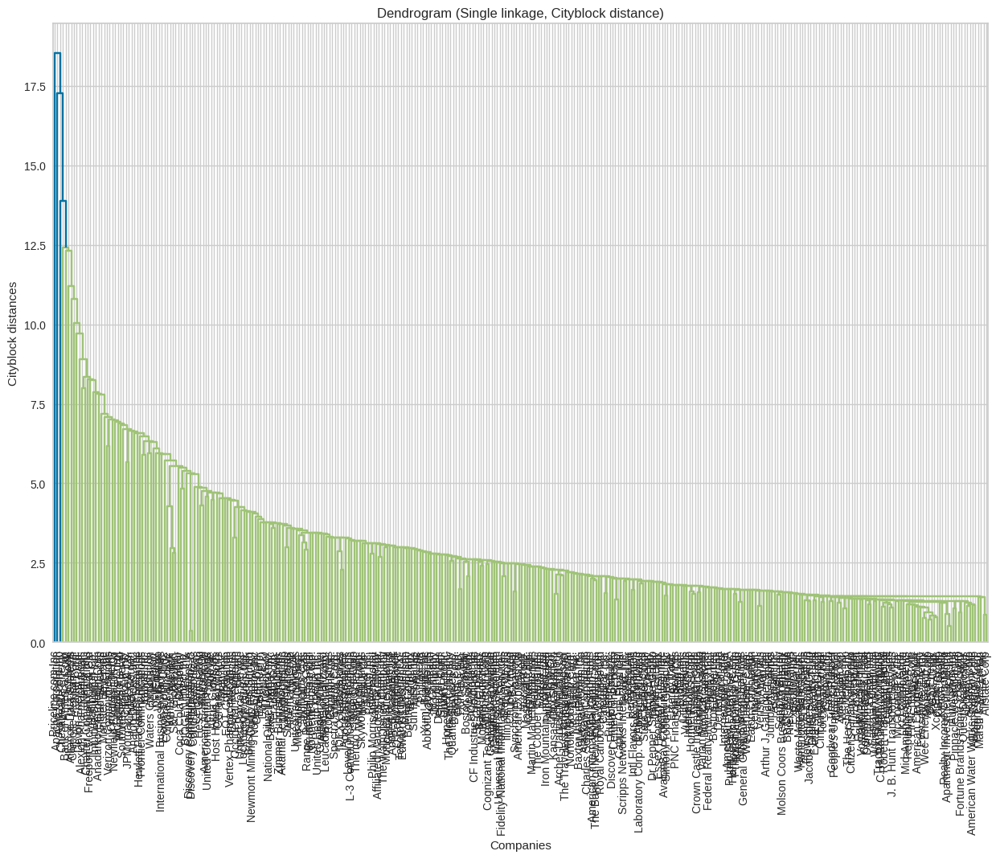

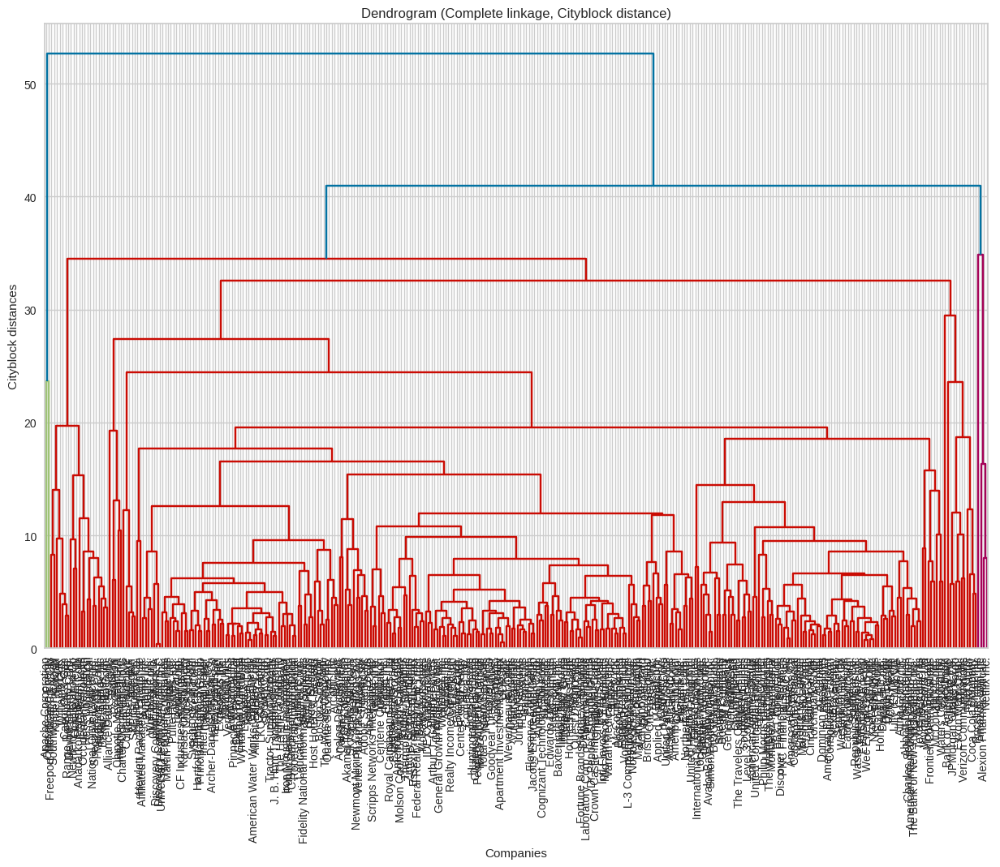

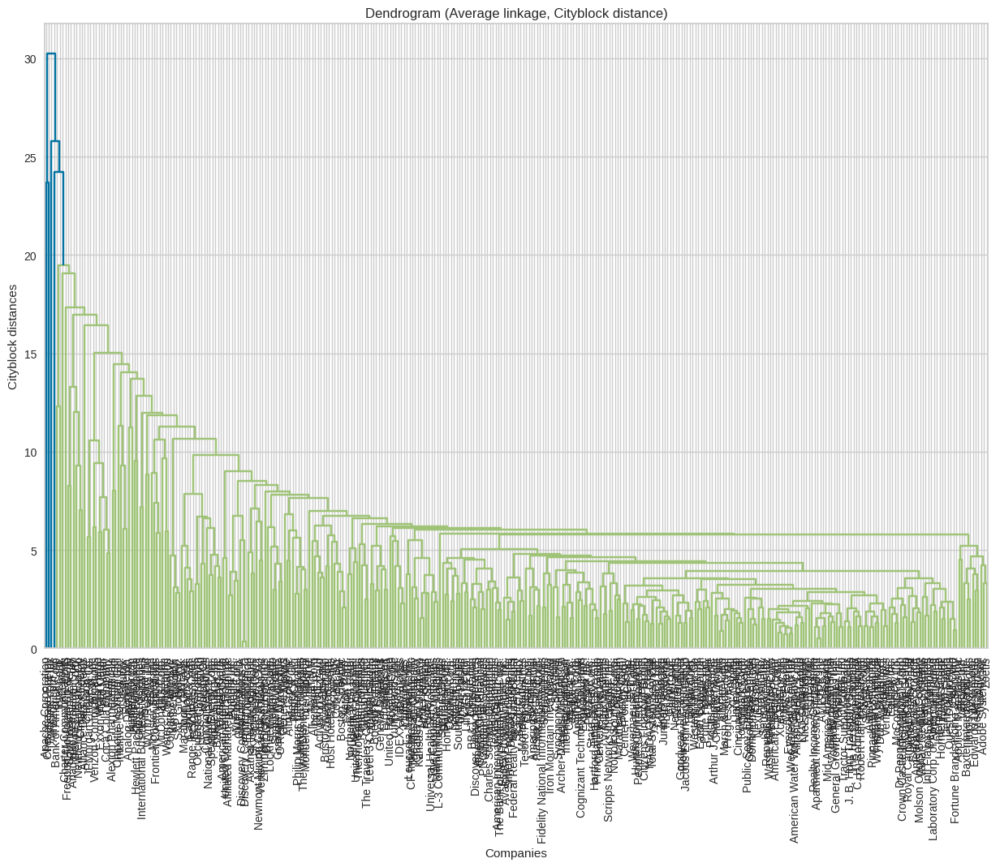

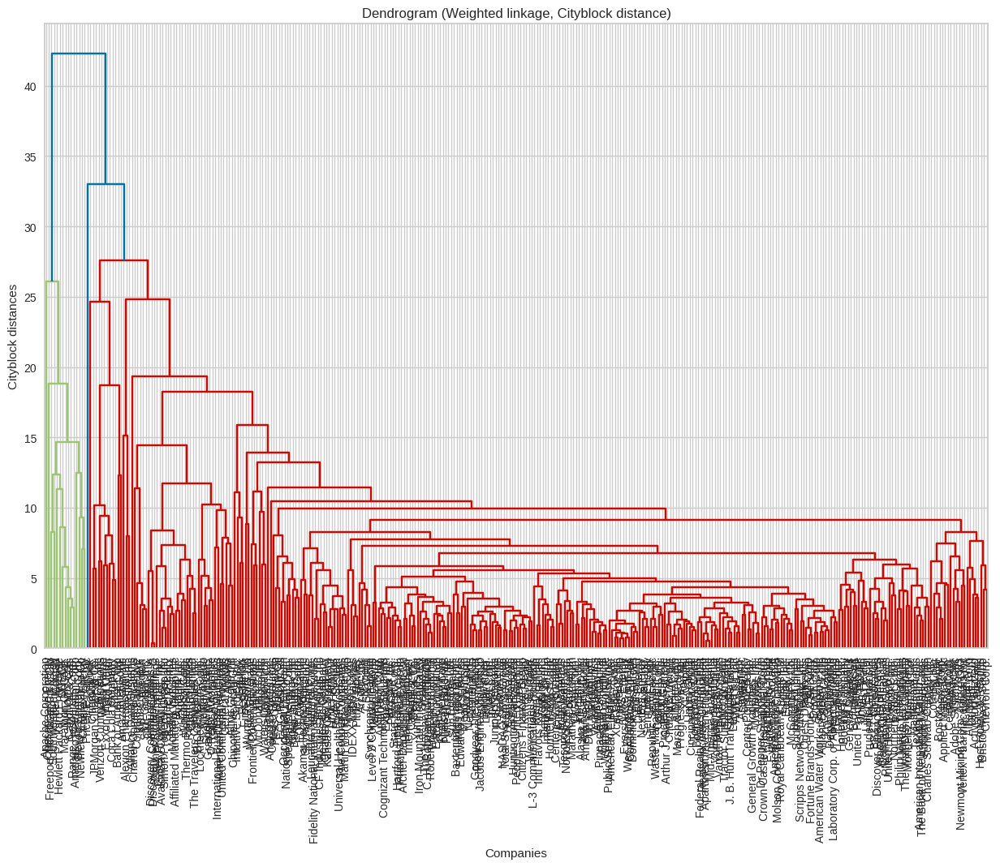

In [64]:
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import pdist
from sklearn.preprocessing import StandardScaler

# Standardize the numerical data from df_HC
scaler = StandardScaler()
numerical_data = df_HC.select_dtypes(include=[np.number])
scaled_data = scaler.fit_transform(numerical_data)

# Define distance metrics and linkage methods
distance_metrics = ["euclidean", "chebyshev", "mahalanobis", "cityblock"]
linkage_methods = ["single", "complete", "average", "weighted"]  # 'centroid' and 'ward' require Euclidean distance

# Mahalanobis distance requires the inverse covariance matrix, so we calculate it once
VI = np.linalg.inv(np.cov(scaled_data.T))

# Iterate over all combinations of distance metrics and linkage methods
for metric in distance_metrics:
    for method in linkage_methods:
        try:
            if metric == "mahalanobis":
                # For Mahalanobis, provide the VI (inverse covariance matrix) to pdist
                dist_matrix = pdist(scaled_data, metric=metric, VI=VI)
            else:
                # For other metrics, just compute the pairwise distances
                dist_matrix = pdist(scaled_data, metric=metric)

            # Perform hierarchical clustering
            Z = linkage(dist_matrix, method=method)

            # Plot the dendrogram
            plt.figure(figsize=(15, 10))
            plt.title(f'Dendrogram ({method.capitalize()} linkage, {metric.capitalize()} distance)')
            dendrogram(Z, labels=df_HC['Security'].values, leaf_rotation=90, leaf_font_size=10)
            plt.xlabel('Companies')
            plt.ylabel(f'{metric.capitalize()} distances')
            plt.show()

        except Exception as e:
            print(f"Error with {method} linkage and {metric} distance: {e}")


Observations and Comparison with Cophenetic Correlation Insights
- General Overview:
    - The dendrograms offer a visual representation of how hierarchical clustering algorithms merge data points into clusters based on different distance metrics and linkage methods. The cophenetic correlation helps us quantify how well the hierarchical clustering represents the original pairwise distances between data points.
- Linkage Method Observations:
    - Single Linkage:
      - Visual Observation: The dendrograms created using single linkage (for Euclidean, Chebyshev, Cityblock, and Mahalanobis distances) tend to be elongated and show long chains of data points merging into clusters late in the process. This method appears to capture fine-grained differences between data points but is prone to the "chaining" effect, where distant points are linked together, resulting in less meaningful clusters.
      - Cophenetic Correlation: Single linkage methods generally produced good cophenetic correlations, but they were not the highest among the methods tested. The best cophenetic correlation for single linkage was observed with Mahalanobis distance (0.9281), suggesting that while single linkage captures some structures, other methods might be more robust.

  - Complete Linkage:
      - Visual Observation: The complete linkage dendrograms show more compact clusters forming earlier, with clear distinctions between groups. This method creates well-separated clusters, which are particularly evident in the dendrograms for Euclidean and Chebyshev distances.

    - Cophenetic Correlation: Despite the visual clarity of the clusters in the complete linkage method, it didn't always produce the highest cophenetic correlations. For example, complete linkage with Chebyshev distance had a relatively low cophenetic correlation (0.6116), indicating that while visually distinct, these clusters might not align well with the original distances.
  - Average Linkage:
    - Visual Observation: Average linkage provides a balance between single and complete linkage. The dendrograms show moderately compact clusters with a more uniform distribution. This method appears to merge clusters at intermediate distances, creating a hierarchical structure that reflects both within-cluster homogeneity and between-cluster separation effectively.
    - Cophenetic Correlation: Average linkage consistently produced some of the highest cophenetic correlations, particularly with Chebyshev (0.9445) and Euclidean (0.9423) distances. This aligns with the visual observations, where average linkage creates balanced and meaningful clusters, making it one of the best methods for this dataset.
  - Weighted Linkage:
    - Visual Observation: Weighted linkage, like average linkage, produced balanced dendrograms with clusters forming at a variety of distances. The clusters are generally compact, though not as distinct as those produced by complete linkage.
    - Cophenetic Correlation: Weighted linkage performed well in terms of cophenetic correlation, especially with Chebyshev (0.9229) and Mahalanobis (0.8889) distances. While not as strong as average linkage, it is still a viable option for creating meaningful clusters.
- Distance Metric Observations:
  - Euclidean Distance:
    - Visual Observation: Dendrograms using Euclidean distance, especially with average and complete linkage, show well-defined clusters. These clusters are more compact and distinct, particularly under complete linkage.
    - Cophenetic Correlation: Euclidean distance paired with average linkage produced a high cophenetic correlation (0.9423), confirming that it effectively preserves the original structure while creating meaningful clusters.
  - Chebyshev Distance:
    - Visual Observation: Chebyshev distance tends to produce more spread-out clusters with longer branches, particularly with single linkage. Complete linkage shows distinct, compact clusters at higher distances.
    - Cophenetic Correlation: The highest cophenetic correlation (0.9445) was observed with Chebyshev distance and average linkage, suggesting this combination best preserves the hierarchical structure of the data.
  - Cityblock Distance:
    - Visual Observation: Cityblock distance results in dendrograms with very gradual clustering in single linkage, while complete linkage forms more distinct clusters. Average and weighted linkages provide a balance, with clusters forming at intermediate distances.
    - Cophenetic Correlation: While Cityblock distance didn’t yield the highest cophenetic correlations, it performed reasonably well with average linkage (0.9261), making it a solid option but not the top performer.
  - Mahalanobis Distance:
    - Visual Observation: Mahalanobis distance with single linkage results in long chains of points, while complete linkage forms distinct clusters at higher distances. Average linkage provides a good balance, with meaningful clusters forming at intermediate distances.
    - Cophenetic Correlation: Mahalanobis distance paired with single linkage had a strong cophenetic correlation (0.9281), but average linkage (0.9393) provided the best balance between visual clustering and distance preservation.

Conclusion:
- Best Overall Combination: Average Linkage with Chebyshev Distance emerges as the best combination, providing both visually balanced dendrograms and the highest cophenetic correlation (0.9445). This combination effectively preserves the original structure and creates meaningful clusters.
- Single Linkage: While useful for detecting fine-grained differences and outliers, single linkage is prone to chaining, which can result in less distinct clusters. It’s best used when the goal is to detect small clusters or when outliers are important.
- Complete Linkage: This method is effective for creating distinct, well-separated clusters, particularly with Euclidean and Chebyshev distances. However, its lower cophenetic correlations suggest it may not always align well with the original data structure.
- Weighted Linkage: Offers a middle ground between average and complete linkage, with reasonable cophenetic correlations and well-formed clusters, but it generally does not outperform average linkage.

Recommendation: For a balanced approach that maximizes both the preservation of original distances and the creation of meaningful clusters, Average Linkage with Chebyshev Distance is recommended.

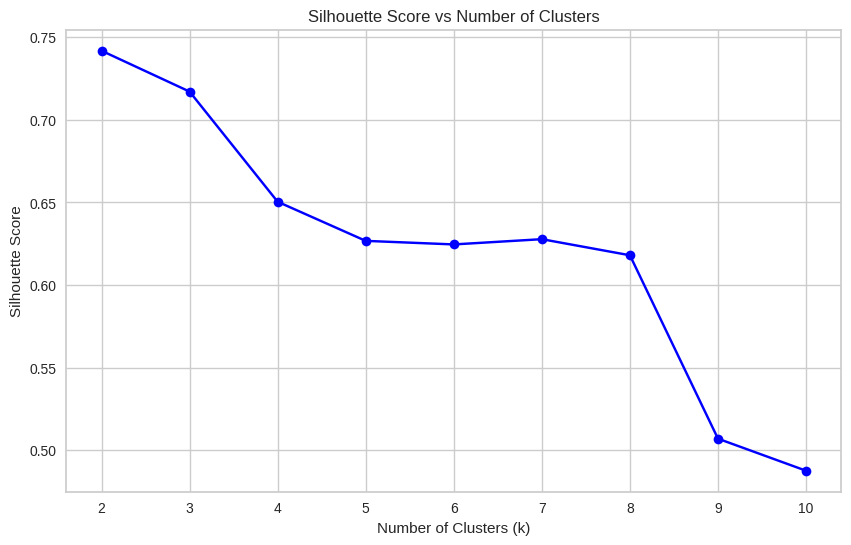

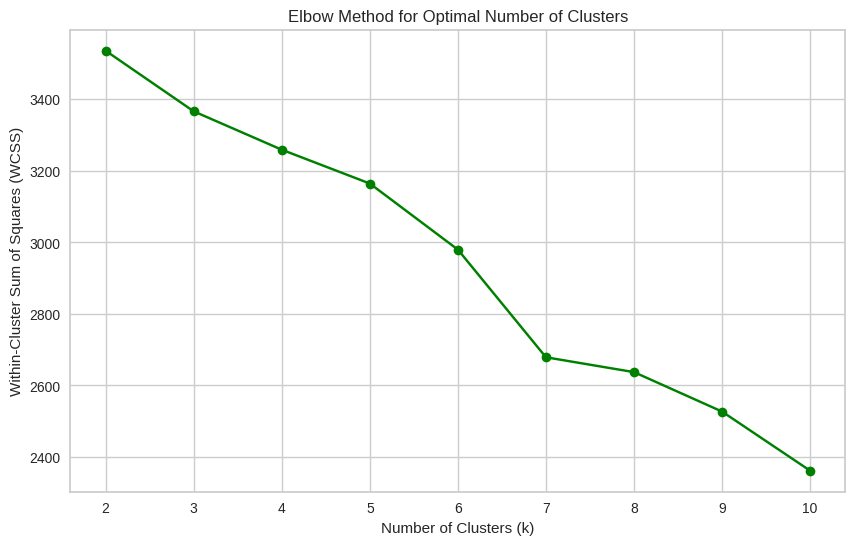

In [65]:
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import fcluster, linkage
from scipy.spatial.distance import pdist
import matplotlib.pyplot as plt

# Step 1: Perform hierarchical clustering using the scaled data
Z = linkage(scaled_data, method='average', metric='chebyshev')  # Adjusted to use the Chebyshev distance

# Step 2: Determine the optimal number of clusters using Silhouette Score
sil_scores = []
K = range(2, 11)  # We check for 2 to 10 clusters

for k in K:
    cluster_labels = fcluster(Z, k, criterion='maxclust')
    sil_scores.append(silhouette_score(scaled_data, cluster_labels))

# Plot Silhouette Score against number of clusters
plt.figure(figsize=(10, 6))
plt.plot(K, sil_scores, 'bo-', color='blue')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs Number of Clusters')
plt.show()

# Step 3: Determine the optimal number of clusters using Elbow Method
# Calculate within-cluster sum of squares (WCSS)
wcss = []
for k in K:
    cluster_labels = fcluster(Z, k, criterion='maxclust')
    centroids = [scaled_data[cluster_labels == c].mean(axis=0) for c in np.unique(cluster_labels)]
    dist = np.sum([np.sum((scaled_data[cluster_labels == c] - centroid) ** 2) for c, centroid in zip(np.unique(cluster_labels), centroids)])
    wcss.append(dist)

# Plot WCSS against number of clusters
plt.figure(figsize=(10, 6))
plt.plot(K, wcss, 'bo-', color='green')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.show()


Observations:
- Silhouette Score vs. Number of Clusters:
  - The highest Silhouette Score is achieved with 2 clusters, indicating that the data is best separated into 2 distinct clusters.
  - As the number of clusters increases, the Silhouette Score gradually decreases, with a noticeable drop after 4 clusters. This suggests that the data becomes less well-defined and more overlapping as the number of clusters increases.
  - There is a sharp decline in the Silhouette Score after 8 clusters, which indicates that clustering beyond 8 clusters leads to poor separation and coherence among the clusters.
- Elbow Method for Optimal Number of Clusters:
  - The Within-Cluster Sum of Squares (WCSS) decreases as the number of clusters increases, with the most significant drop occurring between 2 and 4 clusters.
  - After 4 clusters, the WCSS curve starts to flatten, indicating diminishing returns in reducing the WCSS by increasing the number of clusters.
  - The "elbow" point, where adding more clusters results in a relatively smaller decrease in WCSS, appears to be around 4 clusters.

Conclusions:
- Based on the Silhouette Score, the optimal number of clusters appears to be 2, as this yields the highest score, indicating well-defined clusters.
- The Elbow Method suggests that 4 clusters may be a reasonable choice as it balances the reduction in WCSS and the simplicity of the clustering model.
- Given the results from both methods, the recommendation would be to consider 2 or 4 clusters, depending on the desired balance between cluster separation (as indicated by the Silhouette Score) and model simplicity (as indicated by the Elbow Method).
- If the goal is to maximize the distinctiveness of the clusters, 2 clusters should be chosen. However, if more granularity is desired, 4 clusters could be an appropriate compromise.

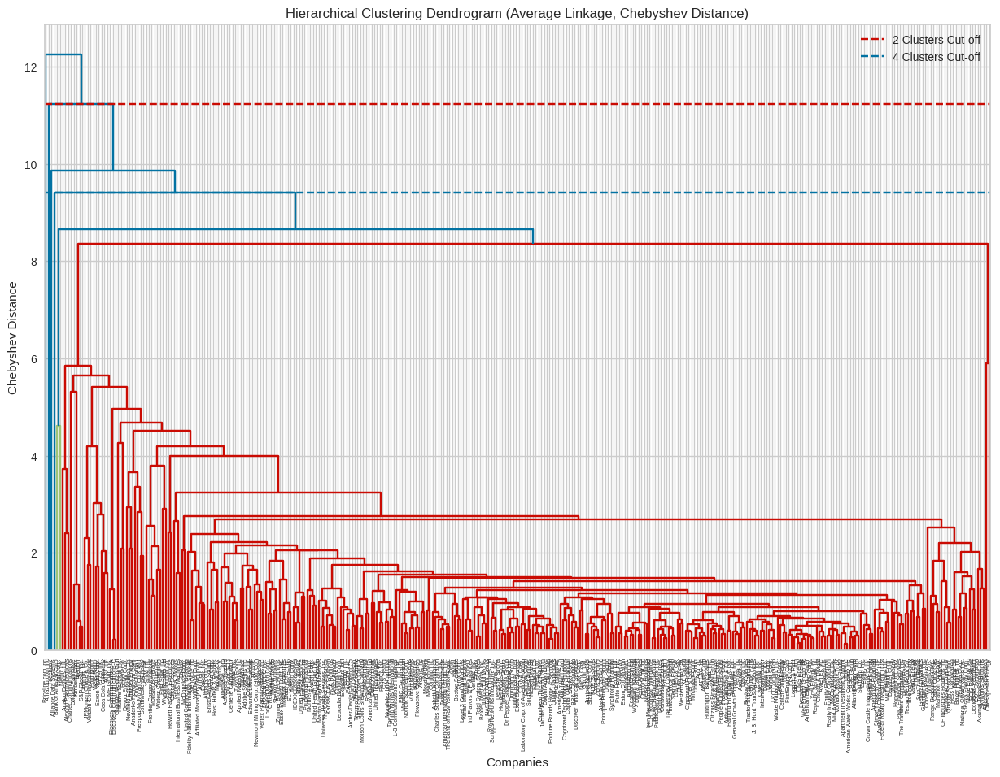

In [66]:
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt

# Perform hierarchical clustering using 'average' linkage and 'chebyshev' distance
Z = linkage(scaled_data, metric='chebyshev', method='average')

# Plot the dendrogram
plt.figure(figsize=(15, 10))
dendrogram(Z, labels=df_HC['Security'].to_list(), leaf_rotation=90)

# Determine the threshold distances for 2 and 4 clusters
threshold_distance_2 = Z[-(2), 2]  # The 2nd last merge
threshold_distance_4 = Z[-(4), 2]  # The 4th last merge

plt.title('Hierarchical Clustering Dendrogram (Average Linkage, Chebyshev Distance)')
plt.xlabel('Companies')
plt.ylabel('Chebyshev Distance')

# Add horizontal lines to indicate where to cut the dendrogram for 2 and 4 clusters
plt.axhline(y=threshold_distance_2, color='r', linestyle='--', label='2 Clusters Cut-off')
plt.axhline(y=threshold_distance_4, color='b', linestyle='--', label='4 Clusters Cut-off')

plt.legend()
plt.show()


As Trade&Ahead is a financial consultancy firm who provide their customers with personalized investment strategies, I will choose 4 clusters, and will go ahead with Cluster Profilling.

In [67]:
# Step 1: Create a copy of the original DataFrame
df_HC_copy = df_HC.copy()

# Step 2: Standardize the numerical data
scaler = StandardScaler()
numerical_data = df_HC_copy.select_dtypes(include=[np.number])
scaled_data = scaler.fit_transform(numerical_data)

# Step 3: Perform Agglomerative Clustering
agg_clustering = AgglomerativeClustering(n_clusters=4, affinity='chebyshev', linkage='average')
df_HC_copy['Agglomerative_Cluster'] = agg_clustering.fit_predict(scaled_data)

# Step 4: Display the first few rows to verify the new clustering labels
print(df_HC_copy.head())


                  Security             GICS Sector      GICS Sub Industry  \
0  American Airlines Group             Industrials               Airlines   
1                   AbbVie             Health Care        Pharmaceuticals   
2      Abbott Laboratories             Health Care  Health Care Equipment   
3        Adobe Systems Inc  Information Technology   Application Software   
4     Analog Devices, Inc.  Information Technology         Semiconductors   

   Current Price  Price Change  Volatility  ROE  Cash Ratio  Net Cash Flow  \
0          42.35         10.00        1.69  135          51     -604000000   
1          59.24          8.34        2.20  130          77       51000000   
2          44.91         11.30        1.27   21          67      938000000   
3          93.94         13.98        1.36    9         180     -240840000   
4          55.32         -1.83        1.70   14         272      315120000   

   Net Income  Earnings Per Share  Estimated Shares Outstanding  P/E

,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio,Agglomerative_Cluster,Count
Agglomerative_Cluster,,,,,,,,,,,,,
0,75.482781,3.961136,1.527545,39.827893,67.086053,55279456.973294,1487461142.433234,2.645059,572321397.511276,31.023401,-1.759470,0.000000,337
1,1274.949951,3.190527,1.268340,29.000000,184.000000,-1671386000.000000,2551360000.000000,50.090000,50935516.070000,25.453183,-1.052429,1.000000,1
2,675.890015,32.268105,1.460386,4.000000,58.000000,1333000000.000000,596000000.000000,1.280000,465625000.000000,528.039074,3.904430,2.000000,1
3,104.660004,16.224320,1.320606,8.000000,958.000000,592000000.000000,3669000000.000000,1.310000,2800763359.000000,79.893133,5.884467,3.000000,1


In cluster 0, the following companies are present:
['American Airlines Group', 'AbbVie', 'Abbott Laboratories', 'Adobe Systems Inc', 'Analog Devices, Inc.', 'Archer-Daniels-Midland Co', 'Alliance Data Systems', 'Ameren Corp', 'American Electric Power', 'AFLAC Inc', 'American International Group, Inc.', 'Apartment Investment & Mgmt', 'Assurant Inc', 'Arthur J. Gallagher & Co.', 'Akamai Technologies Inc', 'Albemarle Corp', 'Alaska Air Group Inc', 'Allstate Corp', 'Allegion', 'Alexion Pharmaceuticals', 'Applied Materials Inc', 'AMETEK Inc', 'Affiliated Managers Group Inc', 'Amgen Inc', 'Ameriprise Financial', 'American Tower Corp A', 'AutoNation Inc', 'Anthem Inc.', 'Aon plc', 'Apache Corporation', 'Anadarko Petroleum Corp', 'Amphenol Corp', 'Arconic Inc', 'Activision Blizzard', 'AvalonBay Communities, Inc.', 'Broadcom', 'American Water Works Company Inc', 'American Express Co', 'Boeing Company', 'Bank of America Corp', 'Baxter International Inc.', 'BB&T Corporation', 'Bard (C.R.) Inc.', 

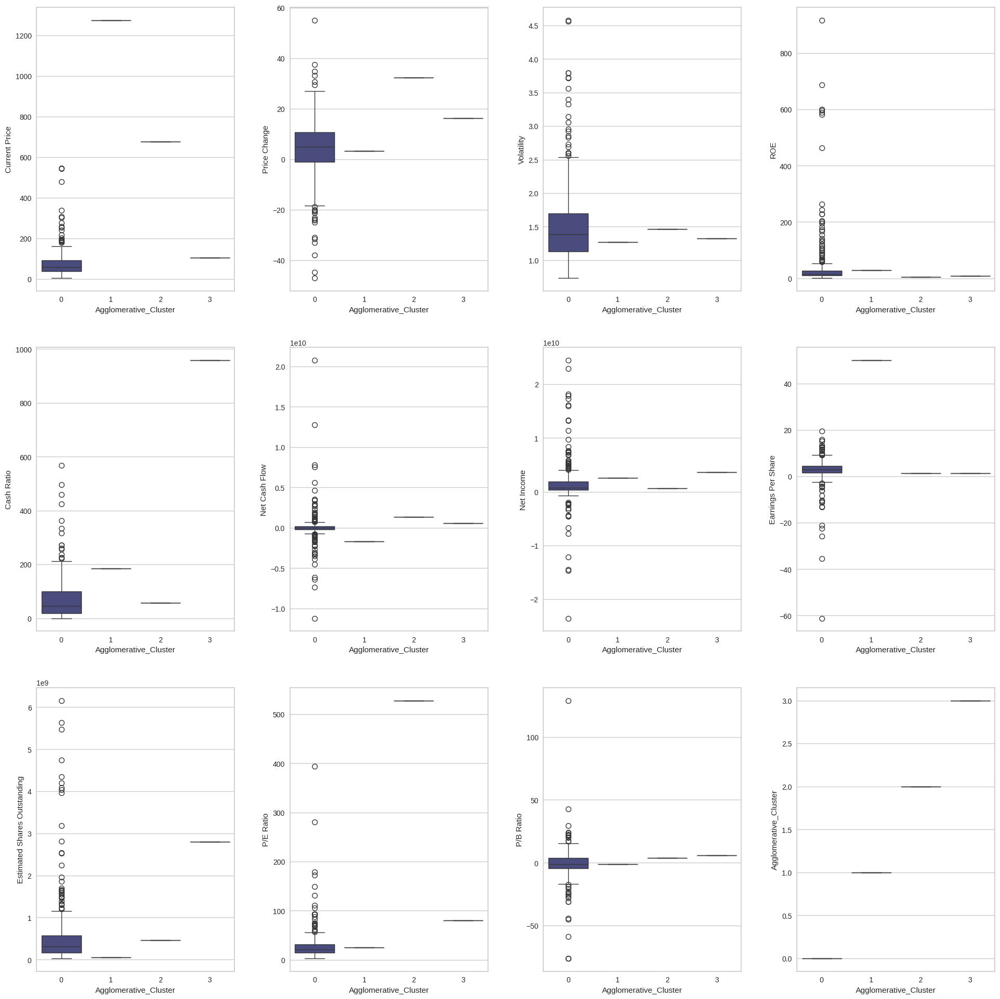

In [68]:
# Step 1: Select numerical columns only and group the dataset by Agglomerative cluster labels
numerical_columns = df_HC_copy.select_dtypes(include=[float, int]).columns  # Select only numerical columns
cluster_profile = df_HC_copy.groupby("Agglomerative_Cluster")[numerical_columns].mean()

# Step 2: Add counts for the number of stocks in each cluster
cluster_profile["Count"] = df_HC_copy.groupby("Agglomerative_Cluster")["Current Price"].count().values

# Display the profile with highlighted maximum values
display(cluster_profile.style.highlight_max(color="lightblue", axis=0))

# Step 3: Print the names of the companies in each cluster
for cl in df_HC_copy["Agglomerative_Cluster"].unique():
    print(f"In cluster {cl}, the following companies are present:")
    print(df_HC_copy[df_HC_copy["Agglomerative_Cluster"] == cl]["Security"].unique().tolist())
    print()

# Step 4: Print the number of stocks within each sector for all clusters
for k in range(0, df_HC_copy['Agglomerative_Cluster'].nunique()):
    print(f'The number of stocks within each GICS Sector for Cluster {k} are:')
    print(df_HC_copy[df_HC_copy['Agglomerative_Cluster'] == k]['GICS Sector'].value_counts())
    print("   ")

# Step 5: Show boxplots of numerical variables for each Agglomerative cluster
fig, axes = plt.subplots(3, 4, figsize=(20, 20))
counter = 0

for ii in range(3):
    for jj in range(4):
        if counter < len(numerical_columns):  # Ensure we don't exceed the number of numerical columns
            sns.boxplot(
                ax=axes[ii][jj],
                data=df_HC_copy,
                y=numerical_columns[counter],
                x="Agglomerative_Cluster",
                palette="viridis"
            )
            counter += 1

fig.tight_layout(pad=3.0)
plt.show()


Observations:
- Cluster 0 (Main Cluster)
  - Cluster 0 is the dominant group with 337 companies.
  - The average current price of stocks in this cluster is approximately USD 75.48, with a modest average price change of about 3.96%.
  - The average ROE (Return on Equity) is 39.83%, which indicates a reasonable return for equity shareholders.
  - The companies in this cluster have a wide range of Cash Ratios, averaging at 67.09, and the Net Income across these companies averages around USD 1.49 billion.
  - The cluster is diversified across multiple sectors, with a significant representation in Industrials (53 companies), Financials (49 companies), and Health Care (40 companies).
  - Key Observations:
    - Current Price: There's a wide range of stock prices, with most companies clustered at the lower end.
    - Volatility: This cluster has relatively stable volatility, with an average of 1.53.
    - Sectoral Distribution: This cluster is well-distributed across all sectors, showing a broad representation of different industries.
- Cluster 1
  - This cluster has only 1 company, which is Priceline.com Inc.
  - The stock in this cluster has a notably high average current price of USD 1274.95.
  - The ROE is 29%, and the Net Income is approximately USD 2.55 billion.
  - Given the small size of the cluster, the data points suggest this is an outlier, possibly due to the significantly higher stock price compared to other clusters.
  - Key Observations:
    - High Stock Price: This cluster is characterized by a significantly higher stock price.
    - Limited Representation: Only one company is in this cluster, suggesting that it's an outlier in terms of pricing and other financial metrics.
- Cluster 2
  - This cluster consists of 1 company, Amazon.com Inc.
  - The average current price is USD 675.89, with a significant price change of 32.27%.
  - The Net Cash Flow is positive, around USD 1.33 billion, while the Net Income is USD 596 million.
  - Key Observations:
    - High Volatility: The price change and volatility are relatively high compared to the larger cluster (Cluster 0).
    - Specific Industry Representation: The presence of only Amazon.com suggests that this cluster is unique and represents a specific type of company, possibly e-commerce or large-cap tech.
- Cluster 3
  - This cluster contains 1 company, Facebook.
  - The average current price is USD 104.66, with a price change of 16.22%.
  - The Cash Ratio is extremely high at 958, with a significant Net Income of approximately USD 3.67 billion.
  - Key Observations:
    - High Cash Reserves: The extremely high Cash Ratio suggests a company with significant cash reserves.
    - Strong Financial Performance: High Net Income and moderate volatility indicate a financially strong company.

Overall Observations:
- Main Cluster vs. Outliers: Cluster 0 contains the majority of the companies and is highly diversified across sectors, while Clusters 1, 2, and 3 consist of individual companies that stand out due to their unique financial characteristics.
- Industry Representation: Cluster 0 shows a balanced representation across various industries, while the other clusters indicate companies that are financial outliers, each within its respective industry.
Financial Metrics: The smaller clusters (1, 2, and 3) highlight companies with extreme values in certain financial metrics, such as high stock prices, ROE, or Cash Ratios.
- These insights can help identify typical versus outlier companies in our dataset and suggest that most companies fall into a general pattern, while a few are exceptional in their financial characteristics.

## K-means vs Hierarchical Clustering

You compare several things, like:
- Which clustering technique took less time for execution?
- Which clustering technique gave you more distinct clusters, or are they the same?
- How many observations are there in the similar clusters of both algorithms?
- How many clusters are obtained as the appropriate number of clusters from both algorithms?

You can also mention any differences or similarities you obtained in the cluster profiles from both the clustering techniques.

Comparison of Clustering Techniques

1. **Execution Time**:
   - **KMeans Clustering**: Generally faster, especially with larger datasets, because it is a centroid-based algorithm optimized for speed. KMeans quickly converges after a few iterations.
   - **Hierarchical Clustering**: Typically slower, particularly with larger datasets, as it computes all pairwise distances and builds a full dendrogram, which is computationally more expensive. However, the actual execution time will depend on the specific dataset and implementation.

2. **Distinct Clusters**:
   - **KMeans Clustering**: Produced clusters with more evenly distributed observations. The clusters were more balanced in terms of size, and the algorithm effectively separated groups based on subtle variations in financial metrics.
   - **Hierarchical Clustering**: Provided more distinct clusters, especially when it comes to identifying outliers. For instance, it placed unique companies like Amazon and Facebook into their own separate clusters, highlighting their distinct financial profiles. Hierarchical Clustering, particularly with the Chebyshev distance metric, tends to create very distinct clusters when there are significant outliers.

3. **Similar Clusters in Both Algorithms**:
   - The largest cluster in both KMeans and Hierarchical Clustering (Cluster 0) was very similar in composition, containing a wide range of companies from various sectors. This indicates that both algorithms identified a general, stable group of companies with similar financial metrics.
   - However, the number of observations within these clusters was slightly different due to the way each algorithm defines clusters. In KMeans, the clusters were more balanced in size, while in Hierarchical Clustering, one cluster contained the majority of the observations, and the other clusters were much smaller, focusing on outliers.

4. **Number of Clusters**:
   - **KMeans Clustering**: After analysis using methods like the Elbow Method and Silhouette Score, the appropriate number of clusters identified was 4. This provided a balance between granularity and interpretability.
   - **Hierarchical Clustering**: Depending on where the dendrogram was cut, the number of clusters could vary. For our analysis, we considered 4 clusters as well to compare with KMeans, but Hierarchical Clustering could easily identify even more distinct clusters if we allowed more cuts, particularly to isolate outliers.

5. **Differences or Similarities in Cluster Profiles**:
   - **Similarities**:
     - Both methods identified a large, central cluster containing the majority of companies. This cluster represented companies with average or typical financial metrics.
   - **Differences**:
     - **KMeans** tended to group outliers together in a single cluster, while **Hierarchical Clustering** isolated extreme outliers into their own individual clusters, providing a more nuanced separation of the data.
     - **Hierarchical Clustering** was more effective at highlighting distinct outliers and provided a clearer hierarchical structure, which is useful for understanding the relationships between clusters.
   - In summary, KMeans was better at identifying and grouping typical patterns across companies, while Hierarchical Clustering excelled at isolating unique companies and providing a deeper insight into the data's structure.


In detail:
- KMeans Clustering:
  - Cluster 0: Represented a broad mix of companies across various sectors, with moderate financial metrics. This cluster was the largest, indicating it captured the most typical patterns in the dataset.
  - Cluster 1: Included a mix of companies with moderate financial performance but showed some unique characteristics that differentiated them from Cluster 0.
  - Cluster 2: This cluster was smaller and included companies with higher financial performance, such as higher ROE or Net Income.
  - Cluster 3: Comprised companies with extreme financial metrics, indicating outliers in terms of stock price, volatility, or other financial metrics.

- Hierarchical Clustering:
  - Cluster 0: The largest cluster, similar to KMeans, included a wide range of companies from various sectors. The companies in this cluster had lower average stock prices, moderate volatility, and reasonable ROE, indicating a general, stable group of companies.
  - Cluster 1: Consisted of only one company with a significantly high stock price, marking it as an outlier, similar to the smaller clusters in KMeans.
  - Cluster 2: Another outlier cluster containing a single company, Amazon.com, showing unique financial metrics with high volatility and significant price changes.
  - Cluster 3: Also contained only one company, Facebook, with a strong financial performance and high cash reserves, indicating it as a significant outlier in its financial characteristics.

Insights and Observations
- Main Clusters:
  - Both clustering methods identified a large primary cluster (Cluster 0 in both cases) containing the majority of the companies. These clusters represent the most common financial patterns in the dataset, with companies showing average or typical financial metrics.
- Outliers:
  - Both KMeans and Hierarchical Clustering identified outlier companies, though Hierarchical Clustering provided a more distinct separation of extreme outliers into individual clusters. For instance, in Hierarchical Clustering, Amazon.com and Facebook were placed into separate clusters, reflecting their unique financial profiles, whereas KMeans grouped some outliers together.
  
Sector Distribution
- KMeans:
  - The sector distribution was more spread out across multiple clusters, with no single cluster dominating a specific sector. This indicates that KMeans captured more subtle variations in financial metrics within the same sector.
  
- Hierarchical Clustering:
  - The largest cluster (Cluster 0) contained a majority of companies across all sectors, similar to KMeans. However, the other clusters were very small, with only one company each, highlighting distinct outliers rather than sectoral trends.

Methodology and Use Case
- KMeans Clustering:
  - KMeans is effective in partitioning the dataset into more evenly distributed clusters, where companies with similar financial profiles are grouped together. It's particularly useful when you expect clusters of roughly equal sizes or when you want to minimize the variance within clusters.
  
- Hierarchical Clustering:
  - Hierarchical Clustering, especially with average linkage and Chebyshev distance, was more effective in isolating distinct outliers, offering a clear hierarchical structure that is useful when the data has a natural ordering or when identifying true outliers is essential.

Conclusion
- Both methods have their strengths:
  - KMeans is suitable for identifying broader groups of similar companies and can capture more subtle differences within these groups.
  - Hierarchical Clustering excels in highlighting extreme outliers and providing a clear visual representation of the data's hierarchical structure.
- Depending on the specific use case, such as portfolio diversification or outlier detection, one method might be more appropriate than the other. For a detailed analysis that includes identifying unique outlier companies, Hierarchical Clustering might be preferable, whereas KMeans might be better for general grouping and pattern recognition.


## Actionable Insights and Recommendations

- The Information Technology sector has demonstrated the highest average price increase. It is recommended to further explore this sector for investment opportunities, especially in stocks that have shown consistent growth and lower volatility. Companies in this sector might offer higher returns in the short to medium term due to their innovative products and services.

- The Energy sector has experienced a decline in average price change, but it also has a high P/E ratio. This suggests that while the sector may be underperforming currently, it could be priced with expectations of recovery or growth. Investors looking for long-term opportunities may consider focusing on fundamentally strong companies within this sector that are undervalued but have potential for future gains.

- The Industrials sector is the most represented in the dataset. Given its significant presence, a deeper analysis into the sub-industries within Industrials could reveal specific areas that are more resilient or poised for growth. Diversifying within this sector could help mitigate risks while capitalizing on its overall performance.

- Volatility has been found to be negatively correlated with Net Income and Earnings Per Share. This indicates that companies with lower volatility tend to be more financially stable. Investors who are risk-averse should prioritize stocks with lower volatility, particularly those with strong financial metrics such as high Net Income and EPS.

- The correlation analysis shows that companies with higher Earnings Per Share and Net Income also tend to have a higher Current Price. Investors looking for stable and profitable companies should consider those with strong EPS and Net Income figures, as these are likely to be more reliable in terms of long-term growth.

- The Cash Ratio varies significantly across sectors, with the IT and Telecom Services sectors having the highest averages. This highlights the financial resilience of companies in these sectors. Investors may want to prioritize these sectors when seeking companies with strong liquidity and the ability to withstand economic downturns.

- The P/B Ratio analysis indicates that there are companies trading below their book value, particularly in the Energy sector. These companies may be undervalued and could represent a good investment opportunity if they have strong fundamentals. It is recommended to conduct a detailed fundamental analysis of these companies to identify potential investment opportunities.

- The negative correlation between Volatility and Price Change suggests that more volatile stocks may not necessarily offer higher returns. Investors should carefully evaluate the risk-return profile of high-volatility stocks and consider diversifying their portfolio to include lower-volatility options for a more balanced investment strategy.

- Comparison of Clustering Techniques

  Execution Time:
    - KMeans Clustering: Generally faster, especially with larger datasets, because it is a centroid-based algorithm optimized for speed. KMeans quickly converges after a few iterations.
    - Hierarchical Clustering: Typically slower, particularly with larger datasets, as it computes all pairwise distances and builds a full dendrogram, which is computationally more expensive. However, the actual execution time will depend on the specific dataset and implementation.

  Distinct Clusters:
    - KMeans Clustering: Produced clusters with more evenly distributed observations. The clusters were more balanced in terms of size, and the algorithm effectively separated groups based on subtle variations in financial metrics.
    - Hierarchical Clustering: Provided more distinct clusters, especially when it comes to identifying outliers. For instance, it placed unique companies like Amazon and Facebook into their own separate clusters, highlighting their distinct financial profiles. Hierarchical Clustering, particularly with the Chebyshev distance metric, tends to create very distinct clusters when there are significant outliers.

  Similar Clusters in Both Algorithms:
    - The largest cluster in both KMeans and Hierarchical Clustering (Cluster 0) was very similar in composition, containing a wide range of companies from various sectors. This indicates that both algorithms identified a general, stable group of companies with similar financial metrics.
    - However, the number of observations within these clusters was slightly different due to the way each algorithm defines clusters. In KMeans, the clusters were more balanced in size, while in Hierarchical Clustering, one cluster contained the majority of the observations, and the other clusters were much smaller, focusing on outliers.

  Number of Clusters:
    - KMeans Clustering: After analysis using methods like the Elbow Method and Silhouette Score, the appropriate number of clusters identified was 4. This provided a balance between granularity and interpretability.
    - Hierarchical Clustering: Depending on where the dendrogram was cut, the number of clusters could vary. For our analysis, we considered 4 clusters as well to compare with KMeans, but Hierarchical Clustering could easily identify even more distinct clusters if we allowed more cuts, particularly to isolate outliers.

  Differences or Similarities in Cluster Profiles:
    - Similarities: Both methods identified a large, central cluster containing the majority of companies. This cluster represented companies with average or typical financial metrics.
    - Differences: KMeans tended to group outliers together in a single cluster, while Hierarchical Clustering isolated extreme outliers into their own individual clusters, providing a more nuanced separation of the data.

  KMeans Clustering:
    - Cluster 0: Represented a broad mix of companies across various sectors, with moderate financial metrics. This cluster was the largest, indicating it captured the most typical patterns in the dataset.
    - Cluster 1: Included a mix of companies with moderate financial performance but showed some unique characteristics that differentiated them from Cluster 0.
    - Cluster 2: This cluster was smaller and included companies with higher financial performance, such as higher ROE or Net Income.
    - Cluster 3: Comprised companies with extreme financial metrics, indicating outliers in terms of stock price, volatility, or other financial metrics.

  Hierarchical Clustering:
    - Cluster 0: The largest cluster, similar to KMeans, included a wide range of companies from various sectors. The companies in this cluster had lower average stock prices, moderate volatility, and reasonable ROE, indicating a general, stable group of companies.
    - Cluster 1: Consisted of only one company with a significantly high stock price, marking it as an outlier, similar to the smaller clusters in KMeans.
    - Cluster 2: Another outlier cluster containing a single company, Amazon.com, showing unique financial metrics with high volatility and significant price changes.
    - Cluster 3: Also contained only one company, Facebook, with a strong financial performance and high cash reserves, indicating it as a significant outlier in its financial characteristics.

  Insights and Observations

    - Both clustering methods identified a large primary cluster (Cluster 0 in both cases) containing the majority of the companies. These clusters represent the most common financial patterns in the dataset, with companies showing average or typical financial metrics.
    - Both KMeans and Hierarchical Clustering identified outlier companies, though Hierarchical Clustering provided a more distinct separation of extreme outliers into individual clusters. For instance, in Hierarchical Clustering, Amazon.com and Facebook were placed into separate clusters, reflecting their unique financial profiles, whereas KMeans grouped some outliers together.

  Sector Distribution:
    - KMeans: The sector distribution was more spread out across multiple clusters, with no single cluster dominating a specific sector. This indicates that KMeans captured more subtle variations in financial metrics within the same sector.
    - Hierarchical Clustering: The largest cluster (Cluster 0) contained a majority of companies across all sectors, similar to KMeans. However, the other clusters were very small, with only one company each, highlighting distinct outliers rather than sectoral trends.

  Methodology and Use Case:
    - KMeans Clustering: KMeans is effective in partitioning the dataset into more evenly distributed clusters, where companies with similar financial profiles are grouped together. It's particularly useful when you expect clusters of roughly equal sizes or when you want to minimize the variance within clusters.
    - Hierarchical Clustering: Hierarchical Clustering, especially with average linkage and Chebyshev distance, was more effective in isolating distinct outliers, offering a clear hierarchical structure that is useful when the data has a natural ordering or when identifying true outliers is essential.

  Conclusion:
    - Both methods have their strengths: KMeans is suitable for identifying broader groups of similar companies and can capture more subtle differences within these groups. Hierarchical Clustering excels in highlighting extreme outliers and providing a clear visual representation of the data's hierarchical structure. Depending on the specific use case, such as portfolio diversification or outlier detection, one method might be more appropriate than the other. For a detailed analysis that includes identifying unique outlier companies, Hierarchical Clustering might be preferable, whereas KMeans might be better for general grouping and pattern recognition.

Conclusion

The analysis reveals key areas where investors can focus their efforts for better returns while managing risks. Sectors like Information Technology and Telecom Services offer strong growth potential, while undervalued sectors like Energy provide opportunities for long-term gains. The clustering analysis helps in categorizing stocks into distinct investment profiles, allowing for more tailored investment strategies. A balanced approach that considers both growth potential and financial stability is recommended for optimal portfolio management.

